<a href="https://colab.research.google.com/github/monishmurali/prediction-of-house-prices/blob/main/Midterm_Team_Titans_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Midterm**:  Housing Data  

* Nohar Reddy Gurrala - 016707821
* Rama Sai Gurunadh Dara - 016709251
* Venkata Murali Monish Addagarla - 016649932
* Namratha Kurapati - 016728816


### **OBJECTIVES**:
To Learn to apply the main ML techniques and tasks thru the lifecycle.
Work as a group on the key machine learning tasks you have learned up till now, use the main three techniques of clustering, classification, regression in the application of a realistic business problem. Learn as a group to divide tasks and bring it together as a team, to write narratives about the tasks and the outcomes, the analysis of the data. Machine Learning Sherlock Holmes detective work in progress!!


**Business Goal/Business Case**:

What properties should an investor buy such that the HOA (Home Owner Association) fees  + Mortgage Fees < Rent so the rental property investment is generating the maximum return on investment (Now with rental. and in the future with the prediction of house prices). Suggest the least , more and most desirable properties that will fulfill their investment objectives.

In [ ]:
!pip3 install regex
!pip3 install request
!pip3 install pydrive
!pip3 install google.colab
!pip3 install oauth2client.client

ERROR: Could not find a version that satisfies the requirement request (from versions: none)
ERROR: No matching distribution found for request
ERROR: Could not find a version that satisfies the requirement oauth2client.client (from versions: none)
ERROR: No matching distribution found for oauth2client.client


In [ ]:
import os
from bs4 import BeautifulSoup
import numpy as np
import pandas as pd
import regex as re
import requests

In [ ]:
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

Established a collaboration with Google to access and read data files stored on Google Drive. This integration significantly enhanced our data acquisition and sharing capabilities, enabling us to streamline workflows and access critical information with ease.

In [ ]:
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

**Importing the 1st dataset: The SanDiego housing dataset provided for the midterm**

In [ ]:
downloaded = drive.CreateFile({'id': '1hu1-1Nf8L5WDdvQrd8vdNGSkbM1BpaGd'})
downloaded.GetContentFile('SJSU-RealEstate-MidTerm-Houses-Data-Oct-2023.csv')
df1 = pd.read_csv('SJSU-RealEstate-MidTerm-Houses-Data-Oct-2023.csv')

In [ ]:
df1.head()

,Listing Pictures,MLS #,Status,Style,Full Address,Zip,Community,MapCoord,Beds,TotB,EstSF,YrBlt,DOMLS,ListPrice,Lst Date,Sold Price,COEDate,Sale/Rent,Vacation Rental By Owner
0,http://cdnparap00.paragonrels.com/ParagonImage...,180045508,ACT,ATT,4095 Bonita Road 132,91902,BONT,NaN,2,2,"1,007",1970,3,"$310,000",8/15/2018,NaN,NaN,For Sale,NaN
1,http://cdnparap00.paragonrels.com/ParagonImage...,180024056,ACT,TOWNH,88 Fourth Ave 10,91910,CV,1310A5,3,2,"1,611",2004,104,"$399,900",5/6/2018,NaN,NaN,For Sale,NaN
2,http://cdnparap00.paragonrels.com/ParagonImage...,180035693,ACT,ATT,2167 Palo Alto Dr 133,91914,CV,1311D2,2,2,"1,061",2006,50,"$374,000",6/29/2018,NaN,NaN,For Sale,NaN
3,http://cdnparap00.paragonrels.com/ParagonImage...,180042493,ACT,TOWNH,2134 Cantata Dr. 36,91914,CV,NaN,2,2,"1,061",2006,17,"$379,000",7/30/2018,NaN,NaN,For Sale,NaN
4,http://cdnparap00.paragonrels.com/ParagonImage...,180038189,ACT,ATT,280 Salinas Dr. 171,91914,CV,NaN,2,2,"1,061",2006,37,"$372,000 - $385,000",7/10/2018,NaN,NaN,For Sale,NaN


**Importing the 2nd dataset: Properties dataset that was scraped from the Zillow website using the 1st dataset addresses and zipcodes.**

In [ ]:
downloaded = drive.CreateFile({'id': '1bXnxrldgYdut1d50lZq7bIuuvNqnEXLo'})
downloaded.GetContentFile('properties.csv')
df2 = pd.read_csv('properties.csv')

In [ ]:
df2.head(2)

,Address,Zip,Type,YearBlt,Heating,Cooling,Parking,HOA,Lot,Rent,Mortgage,Zestimate,SldDte,SellingPrice,price_rise_rate,price_rise_predicted,med_neghbhood_price_rate,MedianZestimate
0,4095 Bonita Road 132,91902,Condo,NaN,NaN,NaN,NaN,470.0,NaN,1950.0,1717.0,326734,10/9/2018,290000.0,5.9,5.8,59.7,720041.0
1,88 Fourth Ave 10,91910,Townhouse,NaN,"Forced air, Gas, Other",Other,2.0,320.0,0.61,2550.0,2062.0,445826,6/25/2019,405000.0,6.5,6.4,3.0,525698.0


**Merged the Sandiego dataset and the additional properties scraped into housing_data dataset to be used throughout the model.**

In [ ]:
housing_data = pd.merge(left=df1, right=df2, how='left', left_on='Full Address', right_on='Address')
housing_data.head(2)

,Listing Pictures,MLS #,Status,Style,Full Address,Zip_x,Community,MapCoord,Beds,TotB,...,Lot,Rent,Mortgage,Zestimate,SldDte,SellingPrice,price_rise_rate,price_rise_predicted,med_neghbhood_price_rate,MedianZestimate
0,http://cdnparap00.paragonrels.com/ParagonImage...,180045508,ACT,ATT,4095 Bonita Road 132,91902,BONT,NaN,2,2,...,NaN,1950.0,1717.0,326734,10/9/2018,290000.0,5.9,5.8,59.7,720041.0
1,http://cdnparap00.paragonrels.com/ParagonImage...,180024056,ACT,TOWNH,88 Fourth Ave 10,91910,CV,1310A5,3,2,...,0.61,2550.0,2062.0,445826,6/25/2019,405000.0,6.5,6.4,3.0,525698.0


# Data Preparation and visualisation


Done By Venkata Murali Monish A


In [ ]:
df = housing_data.filter(items=['Address','Zip_x','Beds','TotB','EstSF','YrBlt','ListPrice','Lst Date','Parking','HOA','Rent','Mortgage','Zestimate','SldDte','SellingPrice','price_rise_rate','price_rise_predicted','med_neghbhood_price_rate','MedianZestimate'])
df.head(15)

,Address,Zip_x,Beds,TotB,EstSF,YrBlt,ListPrice,Lst Date,Parking,HOA,Rent,Mortgage,Zestimate,SldDte,SellingPrice,price_rise_rate,price_rise_predicted,med_neghbhood_price_rate,MedianZestimate
0,4095 Bonita Road 132,91902,2,2,"1,007",1970,"$310,000",8/15/2018,NaN,470.0,1950.0,1717.0,326734,10/9/2018,290000.0,5.9,5.8,59.7,720041.0
1,88 Fourth Ave 10,91910,3,2,"1,611",2004,"$399,900",5/6/2018,2.0,320.0,2550.0,2062.0,445826,6/25/2019,405000.0,6.5,6.4,3.0,525698.0
2,2167 Palo Alto Dr 133,91914,2,2,"1,061",2006,"$374,000",6/29/2018,1.0,127.0,2200.0,1847.0,427769,3/17/2020,400000.0,6.5,3.6,43.4,706252.0
3,2134 Cantata Dr. 36,91914,2,2,"1,061",2006,"$379,000",7/30/2018,2.0,358.0,2200.0,1941.0,412284,3/13/2019,368000.0,6.5,3.6,47.9,706252.0
4,280 Salinas Dr. 171,91914,2,2,"1,061",2006,"$372,000 - $385,000",7/10/2018,2.0,125.0,2240.0,1733.0,412989,6/3/2019,374000.0,6.5,3.6,7.0,706252.0
5,2360 Corte Pescado 88,91914,3,3,"1,285",2006,"$399,000",8/3/2018,2.0,324.0,2495.0,2044.0,450386,10/1/2018,400000.0,6.5,3.6,43.4,706252.0
6,2340 Corte Flores 98,91914,4,3,"1,468",2006,"$419,000",8/15/2018,2.0,324.0,2700.0,2160.0,480511,9/24/2018,427000.0,6.5,3.6,39.5,706252.0
7,2271 Alicante Cove,91914,3,2,"1,342",2000,"$449,000 - $465,900",7/11/2018,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,381 Caminito Barcelona 59,91914,3,3,"1,410",2003,"$480,000 - $490,000",7/23/2018,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,4416 Palm Ave 11,91941,3,3,"1,459",2018,"$510,000",8/3/2018,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


**Checking the data info.**

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 247 entries, 0 to 246
Data columns (total 19 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Address                   246 non-null    object 
 1   Zip_x                     247 non-null    int64  
 2   Beds                      247 non-null    int64  
 3   TotB                      247 non-null    int64  
 4   EstSF                     247 non-null    object 
 5   YrBlt                     247 non-null    int64  
 6   ListPrice                 247 non-null    object 
 7   Lst Date                  247 non-null    object 
 8   Parking                   132 non-null    float64
 9   HOA                       171 non-null    float64
 10  Rent                      180 non-null    float64
 11  Mortgage                  178 non-null    float64
 12  Zestimate                 185 non-null    object 
 13  SldDte                    158 non-null    object 
 14  SellingPri

In [ ]:
df.describe()

,Zip_x,Beds,TotB,YrBlt,Parking,HOA,Rent,Mortgage,SellingPrice,price_rise_rate,price_rise_predicted,med_neghbhood_price_rate,MedianZestimate
count,247.000000,247.000000,247.000000,247.000000,132.000000,171.000000,180.000000,178.000000,158.000000,186.000000,186.000000,186.000000,1.860000e+02
mean,92072.348178,2.453441,2.271255,1984.724696,1.871212,363.081871,2480.000000,2196.073034,428015.822785,5.918817,5.963441,30.251613,6.703253e+05
std,84.624951,0.574579,0.445510,12.472943,0.703376,121.155099,223.952534,340.724967,65937.492618,0.600739,1.944266,17.884655,1.859942e+05
min,91902.000000,2.000000,2.000000,1963.000000,1.000000,24.000000,1950.000000,1582.000000,279000.000000,2.600000,1.500000,0.000000,3.576800e+05
25%,92009.000000,2.000000,2.000000,1975.000000,1.000000,296.500000,2300.000000,1932.000000,372000.000000,6.000000,4.900000,16.900000,5.174760e+05
50%,92104.000000,2.000000,2.000000,1982.000000,2.000000,358.000000,2500.000000,2201.000000,436000.000000,6.000000,6.200000,30.450000,6.592880e+05
75%,92117.000000,3.000000,3.000000,1990.000000,2.000000,418.000000,2650.000000,2482.750000,478750.000000,6.000000,7.100000,43.650000,7.697332e+05
max,92677.000000,4.000000,3.000000,2018.000000,4.000000,834.000000,3000.000000,3101.000000,582000.000000,7.400000,9.700000,99.400000,1.557155e+06




# **Visualising the data using pandas profiling.**

Done By Nohar Reddy Gurrala

**Importing Panda Tools**

In [ ]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Preparing metadata (setup.py) ... done


**Visualising the Data Using Panda Tools**

In [ ]:
import pandas_profiling
pandas_profiling.ProfileReport(df)

<ipython-input-14-bec177b203be>:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Visualising the various relations between each data variables using pairplot grid for better understanding.**

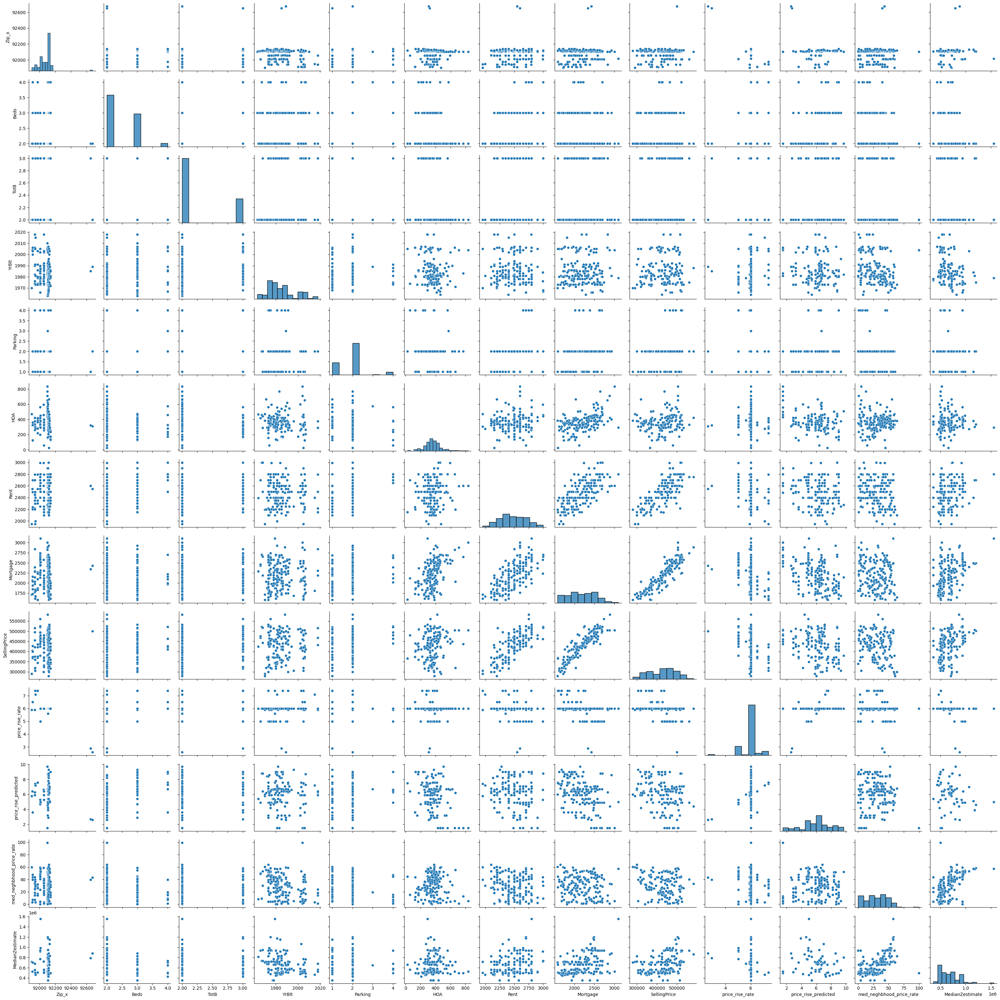

In [ ]:
import seaborn as sns
sns.pairplot(df)

**Converting string to floats and integers for further analysis.**

In [ ]:
for i,data in enumerate(df['ListPrice']):
  data = data.split(' ')[0]
  data = data.replace('$','')
  data = data.replace(' ','')
  data = data.replace(',','')
  df['ListPrice'][i] = data


<ipython-input-16-71b5bcfe91b6>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['ListPrice'][i] = data


In [ ]:
for i,data in enumerate(df['EstSF']):
  data = data.split(' ')[0]
  data = data.replace('$','')
  data = data.replace(' ','')
  data = data.replace(',','')
  df['EstSF'][i] = data

<ipython-input-17-4928c93dcdb0>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['EstSF'][i] = data


* Using only the relevant values and discarding the null value entries.

In [ ]:
df_train = df[df['Rent'].notnull()]
df_train = df_train[df_train['HOA'].notnull()]
df_train = df_train[df_train['Mortgage'].notnull()]
df_train = df_train[df_train['SellingPrice'].notnull()]
# df_train.fillna(value = 0, inplace = True)
df_train.describe()

,Zip_x,Beds,TotB,YrBlt,Parking,HOA,Rent,Mortgage,SellingPrice,price_rise_rate,price_rise_predicted,med_neghbhood_price_rate,MedianZestimate
count,148.000000,148.000000,148.000000,148.000000,110.000000,148.000000,148.000000,148.000000,148.000000,148.000000,148.000000,148.000000,1.480000e+02
mean,92077.736486,2.378378,2.243243,1985.074324,1.872727,363.074324,2480.560811,2192.668919,426006.756757,5.928378,5.905405,31.075000,6.677766e+05
std,81.711902,0.564306,0.430498,11.631000,0.705276,126.814509,225.186430,328.230017,66427.137375,0.554762,1.984182,17.451865,1.789631e+05
min,91902.000000,2.000000,2.000000,1964.000000,1.000000,24.000000,1950.000000,1582.000000,279000.000000,2.600000,1.500000,0.000000,3.576800e+05
25%,92011.000000,2.000000,2.000000,1975.750000,1.250000,295.000000,2300.000000,1932.000000,371500.000000,6.000000,4.900000,17.700000,5.150040e+05
50%,92105.500000,2.000000,2.000000,1982.000000,2.000000,354.500000,2500.000000,2203.500000,435000.000000,6.000000,6.200000,32.050000,6.592880e+05
75%,92119.000000,3.000000,2.000000,1991.000000,2.000000,419.250000,2650.000000,2478.250000,475000.000000,6.000000,7.100000,44.675000,7.664738e+05
max,92677.000000,4.000000,3.000000,2018.000000,4.000000,834.000000,3000.000000,3006.000000,582000.000000,7.400000,9.700000,63.700000,1.200003e+06


**Creating additional features needed from the existing data to achieve the model objectives.**

* Creating 2 year prediction rate and 2 year prediction price variables for predict the price changes after 2 years.

In [ ]:
df_train['2_year_prediction_rate'] = df_train['price_rise_predicted']+((df_train['price_rise_predicted']-df_train['price_rise_rate'])/df_train['price_rise_rate'])*df_train['price_rise_predicted']
df_train['2_year_price_prediction'] = ((df_train['2_year_prediction_rate']*(df_train['SellingPrice'])/100)+df_train['SellingPrice'])

df_train['2_year_price_prediction'].astype(int)
df_train.head()

,Address,Zip_x,Beds,TotB,EstSF,YrBlt,ListPrice,Lst Date,Parking,HOA,...,Mortgage,Zestimate,SldDte,SellingPrice,price_rise_rate,price_rise_predicted,med_neghbhood_price_rate,MedianZestimate,2_year_prediction_rate,2_year_price_prediction
0,4095 Bonita Road 132,91902,2,2,1007,1970,310000,8/15/2018,NaN,470.0,...,1717.0,326734,10/9/2018,290000.0,5.9,5.8,59.7,720041.0,5.701695,306534.915254
1,88 Fourth Ave 10,91910,3,2,1611,2004,399900,5/6/2018,2.0,320.0,...,2062.0,445826,6/25/2019,405000.0,6.5,6.4,3.0,525698.0,6.301538,430521.230769
2,2167 Palo Alto Dr 133,91914,2,2,1061,2006,374000,6/29/2018,1.0,127.0,...,1847.0,427769,3/17/2020,400000.0,6.5,3.6,43.4,706252.0,1.993846,407975.384615
3,2134 Cantata Dr. 36,91914,2,2,1061,2006,379000,7/30/2018,2.0,358.0,...,1941.0,412284,3/13/2019,368000.0,6.5,3.6,47.9,706252.0,1.993846,375337.353846
4,280 Salinas Dr. 171,91914,2,2,1061,2006,372000,7/10/2018,2.0,125.0,...,1733.0,412989,6/3/2019,374000.0,6.5,3.6,7.0,706252.0,1.993846,381456.984615


In [ ]:
df['2_year_prediction_rate'] = df_train['2_year_prediction_rate']
df['2_year_price_prediction'] = df_train['2_year_price_prediction']

* Creating owner_payable and oner_profit variables to hold the amount the owner has to pay and the profit owner will make with that property.

* owner_payable = mortgage + home owner association fees.
* owner_profit = rent - onwer_payable.

In [ ]:
df_train['owner_payable'] = df_train['Mortgage']+df_train['HOA']

In [ ]:
df_train['owner_profit'] = df_train['Rent']-df_train['owner_payable']

In [ ]:
df['owner_payable'] = df_train['owner_payable']
df['owner_profit'] = df_train['owner_profit']

# K-means, GMM and fractal clustering to find the golden cluster for the investors to invest in.

* Here we consider the Listing price of the house and the rent of the house.
* As the listing and the selling price of the house will be segregated into the amount payable, we consider the amount payable by the owner and the profit the owner will make with rent

Done By Rama Sai Gurunadh Dara

In [ ]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns

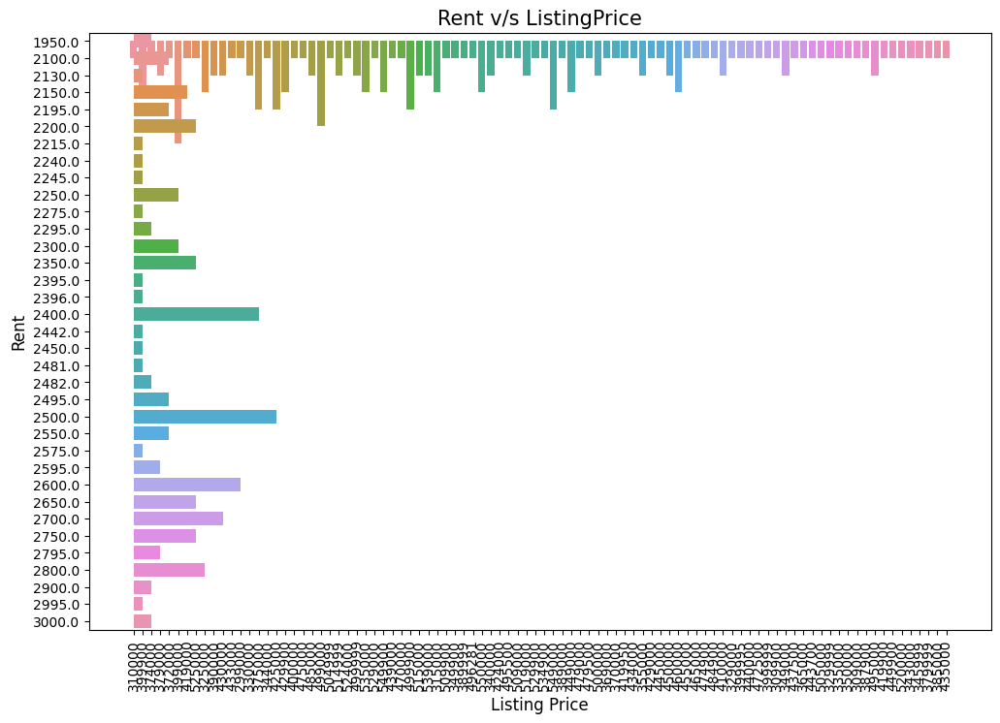

In [ ]:
plt.figure(figsize=(12,8))
sns.countplot(x="ListPrice", data=df_train)
sns.countplot(y="Rent", data=df_train)
plt.ylabel('Rent', fontsize=12)
plt.xlabel('Listing Price', fontsize=12)
plt.xticks(rotation='vertical')
plt.title("Rent v/s ListingPrice", fontsize=15)
plt.show()

* Now we perform K-means, GMM and Fractal Clustering over the owner_payable and owner_profit variables.

# **K-Mean Clustering**

Done by Namratha K

In [ ]:
df_kmeans = df_train.filter(items=['owner_profit','owner_payable'])
df_kmeans.head()

,owner_profit,owner_payable
0,-237.0,2187.0
1,168.0,2382.0
2,226.0,1974.0
3,-99.0,2299.0
4,382.0,1858.0


**Plotting the K-Mean**

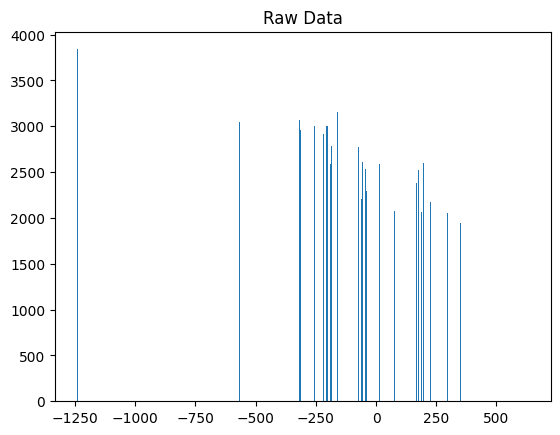

In [ ]:
plt.bar(df_kmeans['owner_profit'].values, df_kmeans['owner_payable'].values)
plt.title("Raw Data")
plt.show()

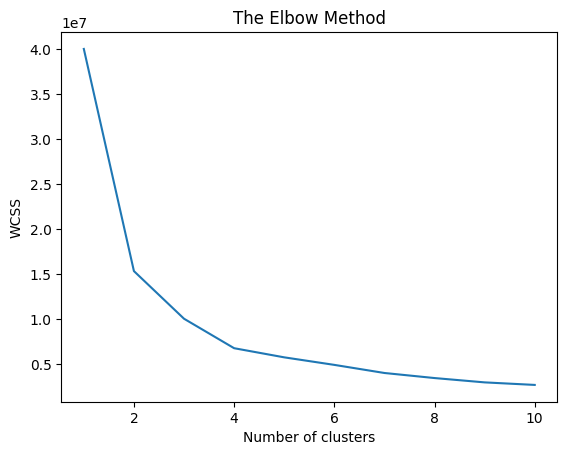

In [ ]:
from sklearn.cluster import KMeans
wcss = []
for i in range(1,11):
    kmeans = KMeans(n_clusters=i,init='k-means++',max_iter=300,n_init=10,random_state=0)
    kmeans.fit(df_kmeans)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,11),wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

**Plotting the Center on the K-Mean**

In [ ]:
kmeans = KMeans(n_clusters=2,init='k-means++',max_iter=300,n_init=10,random_state=0)
y_kmeans = kmeans.fit_predict(df_kmeans)

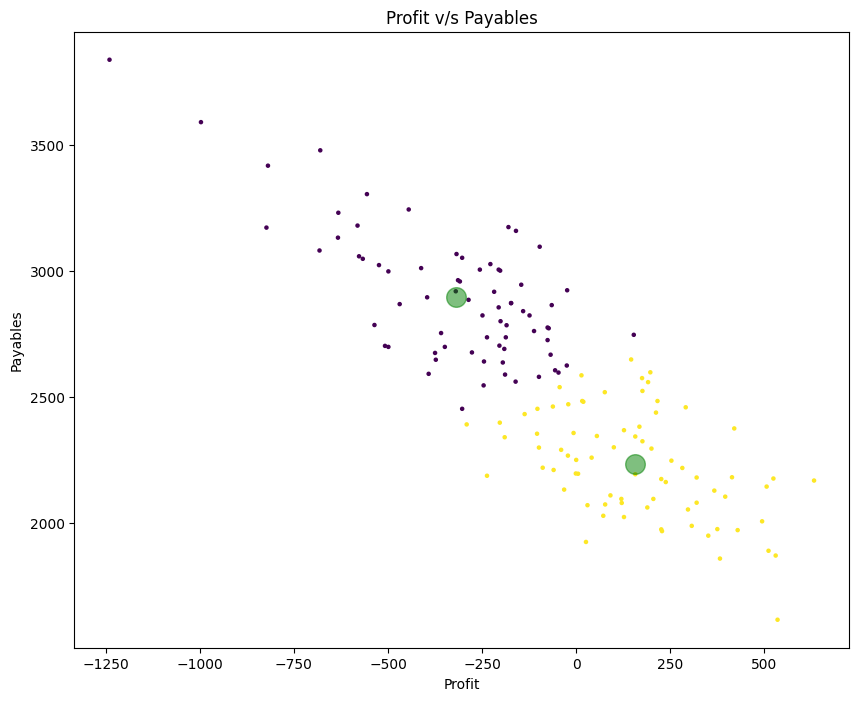

In [ ]:
plt.subplots(figsize=(10, 8))
plt.scatter(df_kmeans['owner_profit'].values, df_kmeans['owner_payable'].values, c=y_kmeans, s=5, cmap='viridis')
km_centers = kmeans.cluster_centers_
plt.title('Profit v/s Payables')
plt.xlabel('Profit')
plt.ylabel('Payables')
plt.scatter(km_centers[:, 0], km_centers[:, 1], c='g', s=200, alpha=0.5);

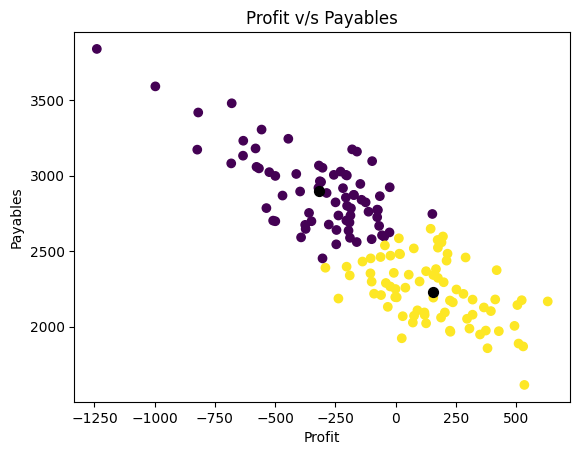

In [ ]:
plt.scatter(df_kmeans['owner_profit'], df_kmeans['owner_payable'],
           c=y_kmeans, cmap ='viridis')

plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=50, c='black', label = 'Centroids')
plt.title('Profit v/s Payables')
plt.xlabel('Profit')
plt.ylabel('Payables')
plt.show()

# **GMM Clustering**

Done by Rama Sai Gurunadh Dara

In [ ]:
from sklearn import mixture
model = mixture.GaussianMixture(n_components=3)

In [ ]:
df_GMM = df_kmeans.filter(items=['owner_profit','owner_payable'])
df_GMM.head()

,owner_profit,owner_payable
0,-237.0,2187.0
1,168.0,2382.0
2,226.0,1974.0
3,-99.0,2299.0
4,382.0,1858.0


In [ ]:
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.cluster import KMeans

In [ ]:
def clustering_errors(k, df_GMM):
    kmeans = KMeans(n_clusters=k).fit(df_GMM)
    predictions = kmeans.predict(df_GMM)
    silhouette_avg = silhouette_score(df_GMM, predictions)
    return silhouette_avg

In [ ]:
import matplotlib.cm as cm

# Define datapoint and labels
clusters = 2
kmeans = KMeans(n_clusters=clusters).fit(df_GMM)
y = kmeans.labels_

range_n_clusters = [2, 3, 4, 5, 6]

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


**Plotting the Graph with Various Constants**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 2 The average silhouette_score is : 0.5142822313776259


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 3 The average silhouette_score is : 0.42065052581425494


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 4 The average silhouette_score is : 0.4216937857763192


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 5 The average silhouette_score is : 0.37019551252012106


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 6 The average silhouette_score is : 0.3520640944762408


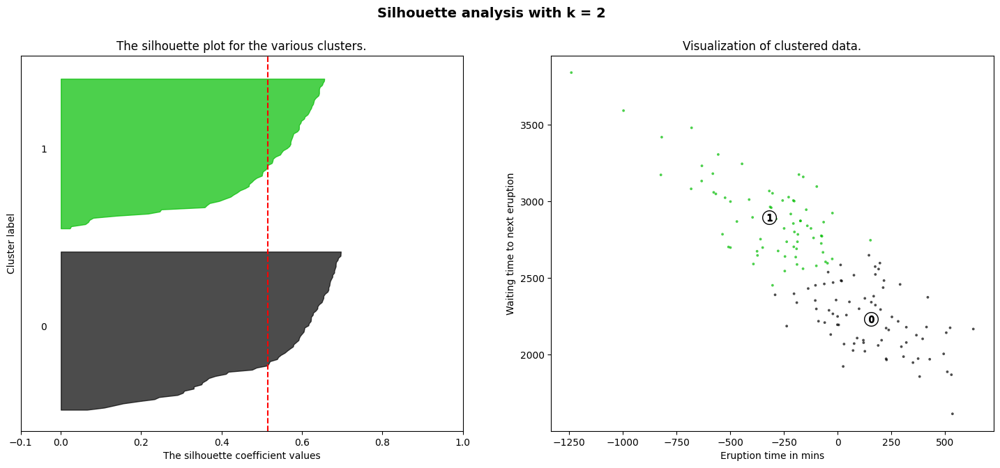

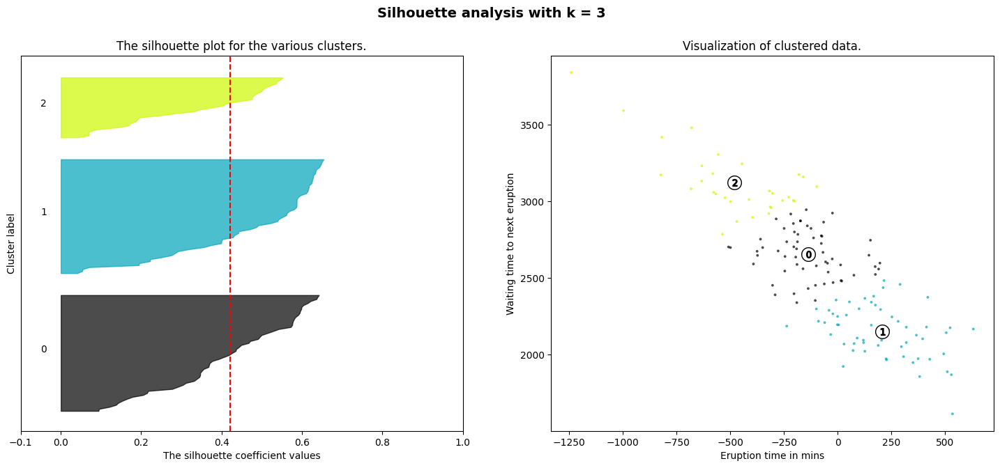

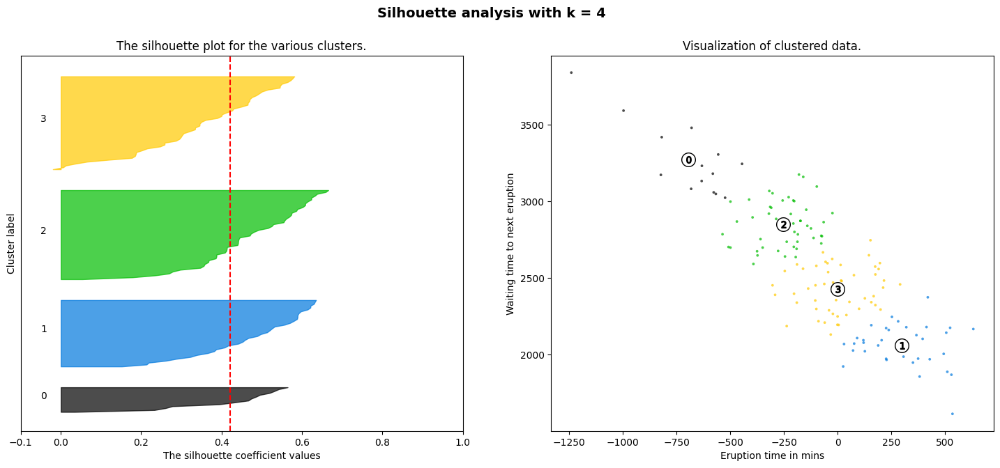

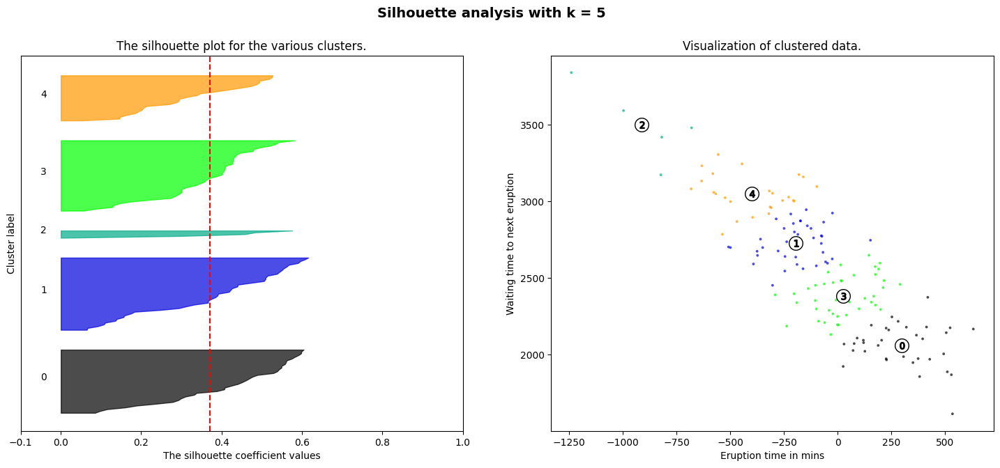

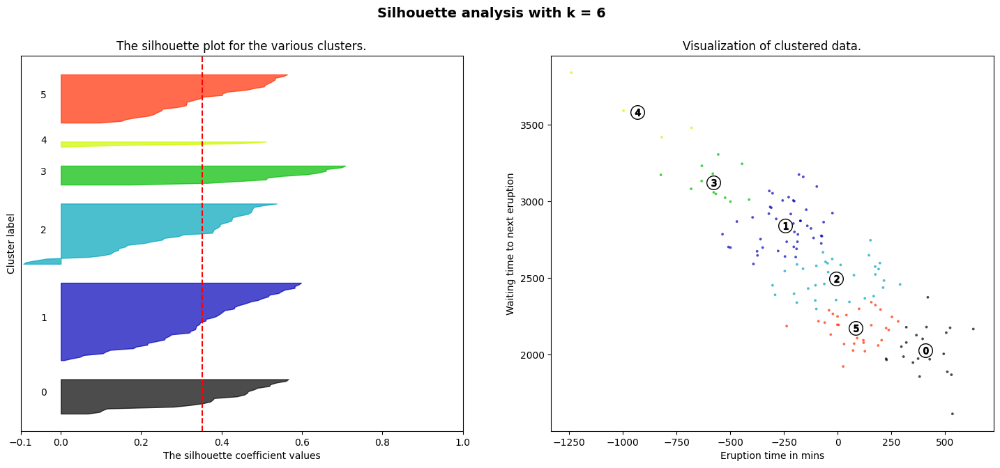

In [ ]:
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(df_GMM) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(df_GMM)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(df_GMM, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_GMM, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(df_GMM['owner_profit'], df_GMM['owner_payable'], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("Visualization of clustered data.")
    ax2.set_xlabel("Eruption time in mins")
    ax2.set_ylabel("Waiting time to next eruption")

    plt.suptitle(("Silhouette analysis with k = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

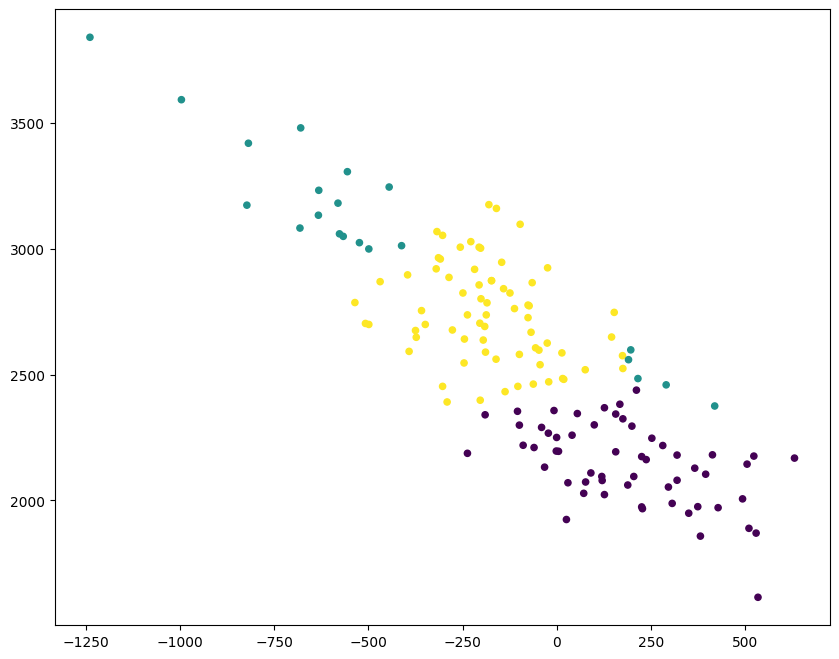

In [ ]:
gmm = model.fit(df_GMM)
labels = gmm.predict(df_GMM)
plt.subplots(figsize=(10, 8))
plt.scatter(df_GMM['owner_profit'], df_GMM['owner_payable'], c=labels, s=20, cmap='viridis');

**Finding Probability of Rates using GMM Clustering**

In [ ]:
probs = gmm.predict_proba(df_GMM)
print(probs[:5].round(3))

[[0.72  0.    0.28 ]
 [0.611 0.129 0.26 ]
 [0.988 0.    0.012]
 [0.682 0.    0.318]
 [0.997 0.    0.003]]


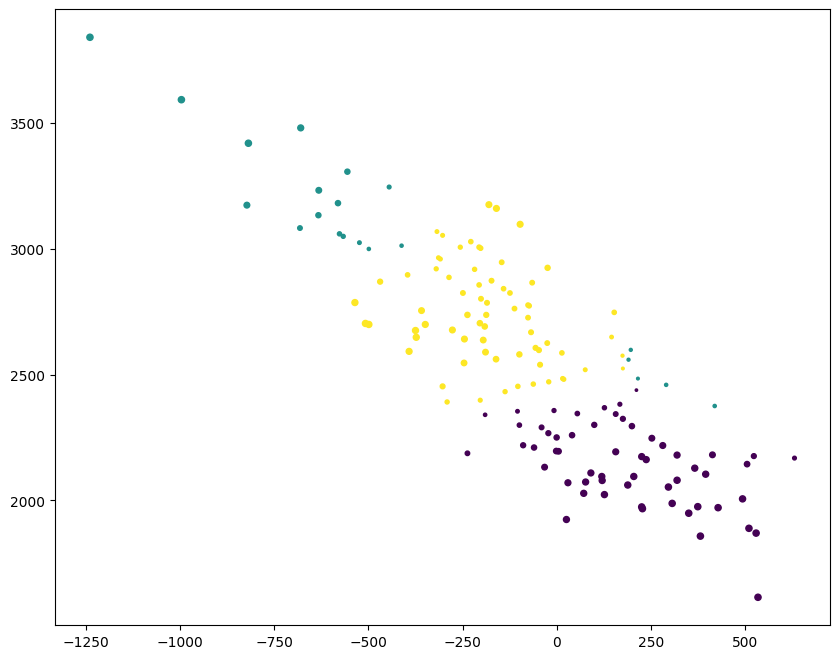

In [ ]:
size = 20 * probs.max(1) ** 2  # square emphasizes differences
plt.subplots(figsize=(10, 8))
plt.scatter(df_GMM['owner_profit'], df_GMM['owner_payable'], c=labels, cmap='viridis', s=size);

In [ ]:
from matplotlib.patches import Ellipse
def draw_ellipse(position, covariance, ax=None, **kwargs):
    """Draw an ellipse with a given position and covariance"""
    ax = ax or plt.gca()

    # Convert covariance to principal axes
    if covariance.shape == (2, 2):
        U, s, Vt = np.linalg.svd(covariance)
        angle = np.degrees(np.arctan2(U[1, 0], U[0, 0]))
        width, height = 2 * np.sqrt(s)
    else:
        angle = 0
        width, height = 2 * np.sqrt(covariance)

    # Draw the Ellipse
    for nsig in range(1, 4):
        ax.add_patch(Ellipse(position, nsig * width, nsig * height,
                             angle, **kwargs))

def plot_gmm(gmm, df_GMM, label=True, ax=None):
    ax = ax or plt.gca()
    labels = gmm.fit(df_GMM).predict(df_GMM)
    if label:
        ax.scatter(df_GMM['owner_profit'], df_GMM['owner_payable'], c=labels, s=20, cmap='viridis', zorder=2)
    else:
        ax.scatter(df_GMM['owner_profit'], df_GMM['owner_payable'], s=20, zorder=2)
    ax.axis('equal')

    w_factor = 0.2 / gmm.weights_.max()
    for pos, covar, w in zip(gmm.means_, gmm.covariances_, gmm.weights_):
        draw_ellipse(pos, covar, alpha=w * w_factor)

<ipython-input-41-e45a22d95ece>:17: MatplotlibDeprecationWarning: Passing the angle parameter of __init__() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.
  ax.add_patch(Ellipse(position, nsig * width, nsig * height,


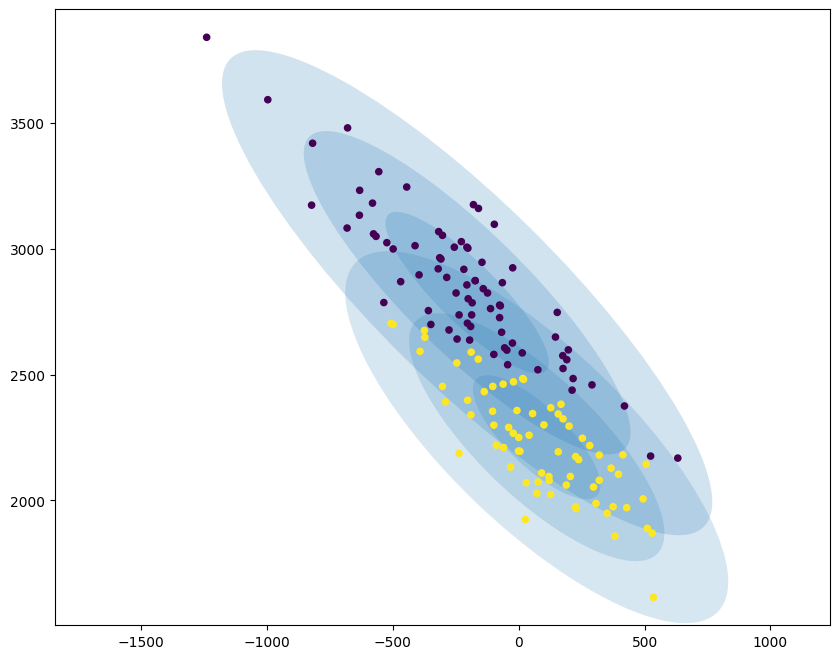

In [ ]:
from sklearn import mixture
plt.subplots(figsize=(10, 8))
model = mixture.GaussianMixture(n_components=2, random_state=42)
gmm = model.fit(df_GMM)
plot_gmm(gmm, df_GMM)

# **Hierarchical Clustering**

Done By Venkata Murali Monish A

In [ ]:
from sklearn.preprocessing import normalize
rent = df_kmeans.fillna(0.001)
data_scaled = normalize(rent)
data_scaled = pd.DataFrame(data_scaled, columns=rent.columns)

X = df.to_numpy()
data_scaled.head()

,owner_profit,owner_payable
0,-0.107737,0.994179
1,0.070354,0.997522
2,0.113745,0.993510
3,-0.043022,0.999074
4,0.201385,0.979512


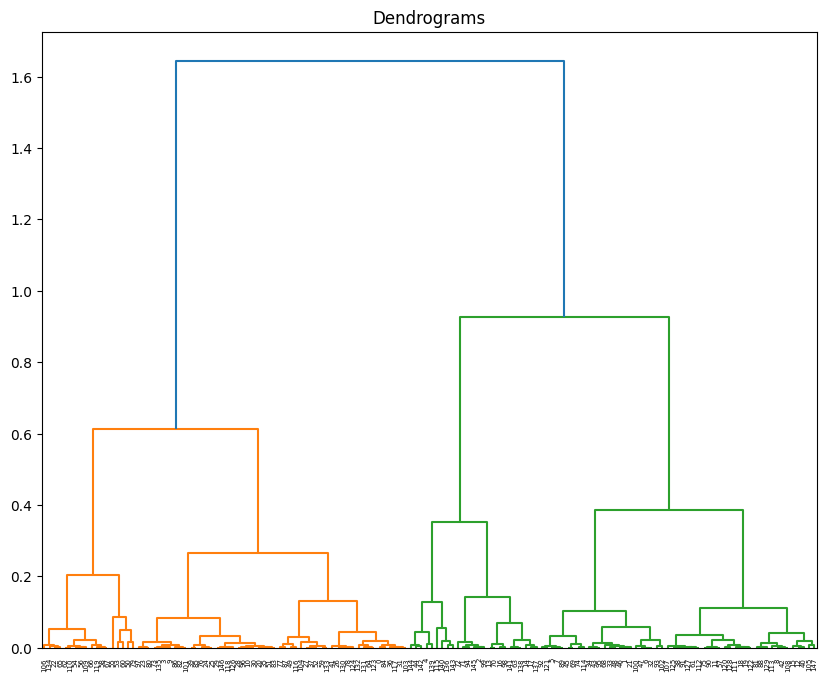

In [ ]:
import scipy.cluster.hierarchy as shc
plt.figure(figsize=(10, 8))
plt.title("Dendrograms")
dend = shc.dendrogram(shc.linkage(data_scaled, method='ward'))

# **Fractal Clustering**

Done By Nohar Reddy Gurrala

In [ ]:
from sklearn.preprocessing import RobustScaler
from sklearn import metrics

In [ ]:
df_train['ListPrice'] = df_train['ListPrice'].astype(float)
df_train['EstSF'] = df_train['EstSF'].astype(int)
df['ListPrice'] = df['ListPrice'].astype(float)
df['EstSF'] = df['EstSF'].astype(int)

* Defining the function to plot the data to fetch number of cluster at every iteration of fractal clustering.

In [ ]:
def plot_cluster(df, max_loop=50):
    """
    Looking at the performance of various number of clusters using K-Means.
    Performance is evaluated by within cluster SSE and silhouette score.
    """
    try:
        df.drop('cluster', axis=1, inplace=True)
    except:
        next
    # X = df.iloc[:,1:]
    X = df.iloc[:,[21,22]].values

    # robust scaling is used so that the centering and scaling statistics are therefore not influenced by a few number of very large marginal outliers as they are based on percentiles
    rb = RobustScaler()
    X_rb = rb.fit_transform(X)

    sse_within_cluster = {}
    silhouette_score = {}

    for k in range(2, max_loop):
        kmeans = KMeans(n_clusters=k,  random_state=10, n_init=10)
        kmeans.fit(X_rb)
        sse_within_cluster[k] = kmeans.inertia_
        silhouette_score[k] = metrics.silhouette_score(X_rb, kmeans.labels_, random_state=10)

    _ = plt.figure(figsize=(10,6))
    ax1 = plt.subplot(211)
    _ = plt.plot(list(sse_within_cluster.keys()), list(sse_within_cluster.values()))
    _ = plt.xlabel("Number of Clusters")
    _ = plt.ylabel("SSE Within Cluster")
    _ = plt.title("Within Cluster SSE After K-Means Clustering")
    _ = plt.xticks([i for i in range(2, max_loop)], rotation=75)

    ax2 = plt.subplot(212)
    _ = plt.plot(list(silhouette_score.keys()), list(silhouette_score.values()))
    _ = plt.xlabel("Number of Clusters")
    _ = plt.ylabel("Silhouette Score")
    _ = plt.title("Silhouette Score After K-Means Clustering")
    _ = plt.xticks([i for i in range(2, max_loop)], rotation=75)

    plt.subplots_adjust(top=0.92, bottom=0.08, left=0.10, right=0.95, hspace=0.5, wspace=0.35)

* Defining the function to apply k-means on the data based on the cluster selected from the above function.

In [ ]:
def apply_cluster(df, clusters=2):
    """
    Applying K-Means with the optimal number of clusters identified
    """
    try:
        df.drop('cluster', axis=1, inplace=True)
    except:
        next
    # X = df.iloc[:,1:]
    X = df.iloc[:, [21,22]].values

    X = X.astype(int)

    rb = RobustScaler()
    X_rb = rb.fit_transform(X)
    kmeans = KMeans(n_clusters = clusters, init = 'k-means++', random_state = 42)
    y_kmeans = kmeans.fit_predict(X_rb)

    score = metrics.silhouette_score(X_rb, kmeans.labels_, random_state=10)
    df['cluster'] = kmeans.labels_
    sse_within_cluster = kmeans.inertia_

    plt.subplots(figsize=(10, 8))
    plt.scatter(X_rb[:,0], X_rb[:,1], c=kmeans.labels_, s=15, cmap='viridis')
    km_centers = kmeans.cluster_centers_
    plt.title('Listing Price and Profit')
    plt.xlabel('Listing Price')
    plt.ylabel('Profit Per Month')
    plt.scatter(km_centers[:,0], km_centers[:,1], marker=",", color='r', s=150)


    print("clustering performance")
    print("-----------------------------------")
    print("silhouette score: " + str(score.round(2)))
    print("sse withing cluster: " + str(sse_within_cluster))

    return df

* Determining K for first iteration.

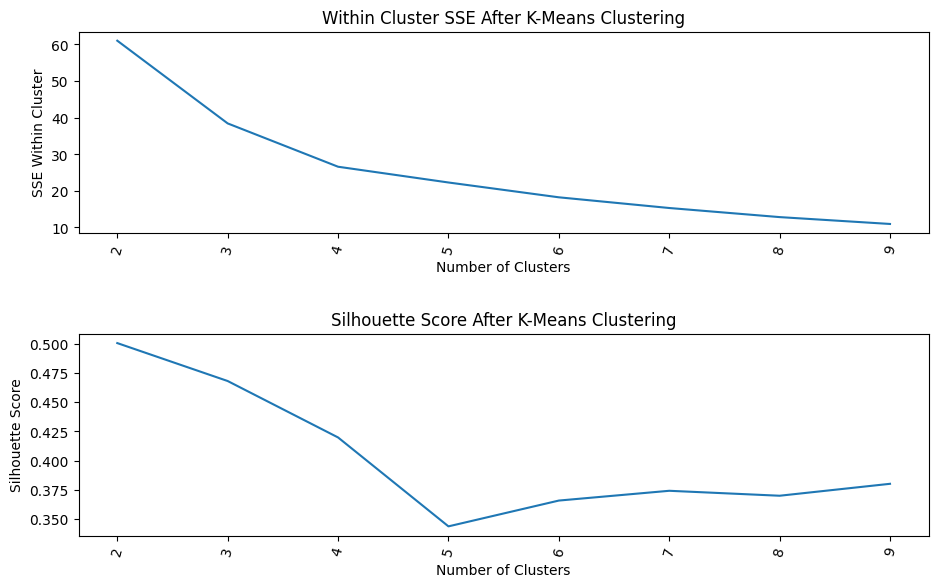

In [ ]:
plot_cluster(df_train, max_loop=10)

**Based in the silhoutte score and elbow score we select k = 3 for first iteration.**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


clustering performance
-----------------------------------
silhouette score: 0.47
sse withing cluster: 38.41857614443755


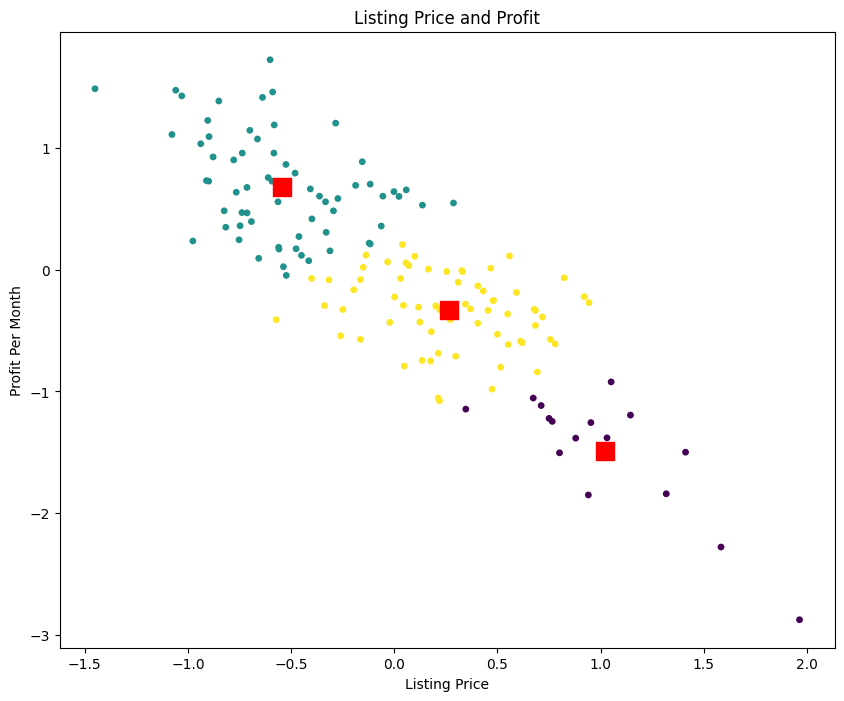

In [ ]:
first_trial = apply_cluster(df_train, clusters=3)

* Grouping the cluster and sorting by pwner_payable as we want to minimize the spending for the investors.


In [ ]:
cluster_perf_df = (
    first_trial
    .groupby('cluster')
    .agg({"owner_payable":"mean", "owner_profit":"mean", "ListPrice":"count"})
    .sort_values('owner_payable')
    .reset_index()
)

cluster_perf_df

,cluster,owner_payable,owner_profit,ListPrice
0,1,2206.938462,206.523077,65
1,2,2734.313433,-205.373134,67
2,0,3225.000000,-674.437500,16


* Selecting cluster 2 for further iterations.

In [ ]:
df_sub = df_train.query("cluster == 1").reset_index(drop=True)

* Determining K for the 2nd iteration.

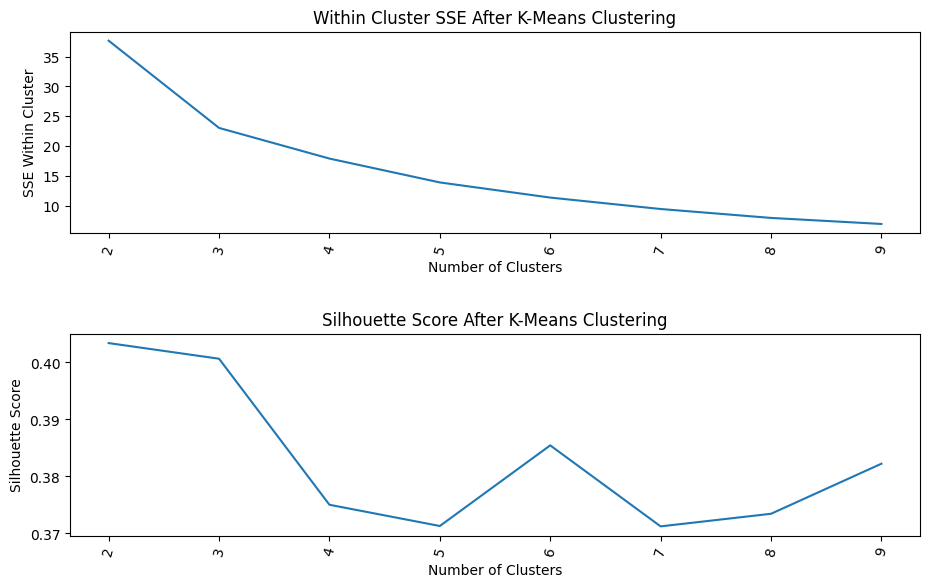

In [ ]:
plot_cluster(df_sub, max_loop=10)

* Based on the values, we select k = 3 for 2nd iteration.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


clustering performance
-----------------------------------
silhouette score: 0.4
sse withing cluster: 23.0307593183602


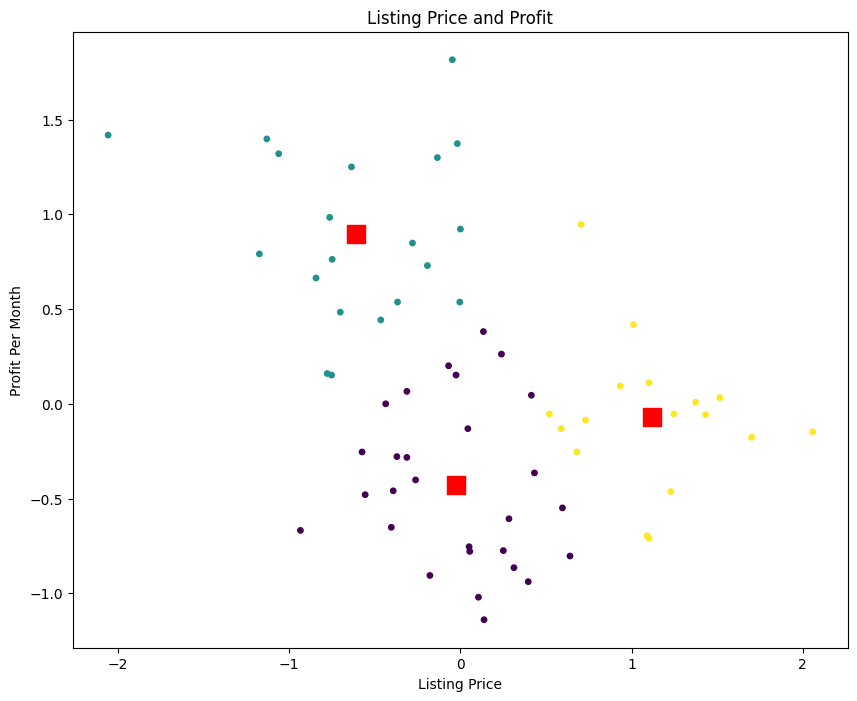

In [ ]:
second_trial= apply_cluster(df_sub, clusters=3)

In [ ]:
sub_cluster_perf_df = (
    second_trial
    .groupby('cluster')
    .agg({"owner_payable":"mean", "owner_profit":"mean", "ListPrice":"count"})
    .sort_values('owner_payable')
    .reset_index()
)

sub_cluster_perf_df

,cluster,owner_payable,owner_profit,ListPrice
0,1,2013.800000,407.200000,20
1,0,2173.785714,84.428571,28
2,2,2488.764706,171.529412,17


* Based on the above clustering, we will perform one more iteration on the 0th cluster, to get our golden cluster.

In [ ]:
df_sub_2 = second_trial.query("cluster == 1").reset_index(drop=True)

In [ ]:
sub_cluster_perf_df_1 = (
    df_sub_2
    .groupby('cluster')
    .agg({"owner_payable":"mean", "owner_profit":"mean", "ListPrice":"count"})
    .sort_values('owner_payable')
    .reset_index()
)

sub_cluster_perf_df_1

,cluster,owner_payable,owner_profit,ListPrice
0,1,2013.8,407.2,20


In [ ]:
df_sub_2.query("cluster == 1")

,Address,Zip_x,Beds,TotB,EstSF,YrBlt,ListPrice,Lst Date,Parking,HOA,...,SellingPrice,price_rise_rate,price_rise_predicted,med_neghbhood_price_rate,MedianZestimate,2_year_prediction_rate,2_year_price_prediction,owner_payable,owner_profit,cluster
0,2167 Palo Alto Dr 133,91914,2,2,1061,2006,374000.0,6/29/2018,1.0,127.0,...,400000.0,6.5,3.6,43.4,706252.0,1.993846,407975.384615,1974.0,226.0,1
1,280 Salinas Dr. 171,91914,2,2,1061,2006,372000.0,7/10/2018,2.0,125.0,...,374000.0,6.5,3.6,7.0,706252.0,1.993846,381456.984615,1858.0,382.0,1
2,3525 Grove St 116,91945,3,2,1088,2005,330000.0,7/10/2018,1.0,306.0,...,320000.0,7.4,7.4,36.4,503332.0,7.400000,343680.000000,1988.0,307.0,1
3,3180 Florine Dr 4,91945,3,3,1588,1991,375000.0,5/16/2018,2.0,290.0,...,360000.0,7.4,7.4,28.5,503332.0,7.400000,386640.000000,2128.0,367.0,1
4,2033 Terraspiro Ave,91977,3,3,1179,1973,375000.0,6/5/2018,2.0,220.0,...,375000.0,7.4,7.6,26.1,507588.0,7.805405,404270.270270,2053.0,297.0,1
5,3160 Camino Crest Dr,92056,2,2,1300,1974,550000.0,8/11/2018,4.0,56.0,...,480000.0,6.0,6.4,15.1,565352.0,6.826667,512768.000000,2176.0,524.0,1
6,836 W Pennsylvania Ave 205,92103,2,2,1025,1973,499000.0,7/4/2018,1.0,155.0,...,435000.0,6.0,3.2,25.6,584662.0,1.706667,442424.000000,2181.0,414.0,1
7,5244 Caminito Cachorro,92105,3,3,1330,1986,419950.0,7/21/2018,2.0,165.0,...,407000.0,6.0,8.7,16.2,485784.0,12.615000,458343.050000,2080.0,320.0,1
8,4300 Newton Avenue 103,92113,4,3,1457,2007,399999.0,8/2/2018,2.0,208.0,...,411000.0,6.0,7.3,7.0,431137.0,8.881667,447503.650000,2180.0,320.0,1
9,4897 Collwood Blvd A,92115,2,2,1056,1970,309900.0,8/3/2018,1.0,385.0,...,279000.0,6.0,6.0,60.5,707118.0,6.000000,295740.000000,1967.0,228.0,1


**These 4 are the housing properties that will cost the least to investors and will fetch the maximum profit. As such, I would recommend these 4 housing properties to invest in.**

# **Potential Homebuyers Interested in Purchasing Houses**

Done By Namratha K

**Based on the above Fractal clustering values we could say that:**

**These are the Houses Buyers will be most interested to buy**

In [ ]:
df_train.query("cluster == 1")

,Address,Zip_x,Beds,TotB,EstSF,YrBlt,ListPrice,Lst Date,Parking,HOA,...,SellingPrice,price_rise_rate,price_rise_predicted,med_neghbhood_price_rate,MedianZestimate,2_year_prediction_rate,2_year_price_prediction,owner_payable,owner_profit,cluster
1,88 Fourth Ave 10,91910,3,2,1611,2004,399900.0,5/6/2018,2.0,320.0,...,405000.0,6.5,6.4,3.0,525698.0,6.301538,430521.230769,2382.0,168.0,1
2,2167 Palo Alto Dr 133,91914,2,2,1061,2006,374000.0,6/29/2018,1.0,127.0,...,400000.0,6.5,3.6,43.4,706252.0,1.993846,407975.384615,1974.0,226.0,1
4,280 Salinas Dr. 171,91914,2,2,1061,2006,372000.0,7/10/2018,2.0,125.0,...,374000.0,6.5,3.6,7.0,706252.0,1.993846,381456.984615,1858.0,382.0,1
5,2360 Corte Pescado 88,91914,3,3,1285,2006,399000.0,8/3/2018,2.0,324.0,...,400000.0,6.5,3.6,43.4,706252.0,1.993846,407975.384615,2368.0,127.0,1
6,2340 Corte Flores 98,91914,4,3,1468,2006,419000.0,8/15/2018,2.0,324.0,...,427000.0,6.5,3.6,39.5,706252.0,1.993846,435513.723077,2484.0,216.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
240,7076 Attleborough Ct,92139,3,2,1568,1981,425000.0,5/24/2018,4.0,128.0,...,440000.0,6.0,9.0,11.8,499077.0,13.500000,499400.000000,2144.0,506.0,1
241,1886 Manzana Way,92139,4,3,1555,1986,435000.0,8/15/2018,2.0,172.0,...,425000.0,6.0,9.0,14.8,499077.0,13.500000,482375.000000,2168.0,632.0,1
242,7019 DEERHURST CT,92139,3,2,1381,1980,425000.0,8/9/2018,2.0,134.0,...,405000.0,6.0,9.0,18.9,499077.0,13.500000,459675.000000,2006.0,494.0,1
243,2233 Manzana Way,92139,4,3,1701,1985,460000.0,8/10/2018,4.0,235.0,...,463500.0,6.0,9.0,1.0,499077.0,13.500000,526072.500000,2459.0,291.0,1


**These are the Houses which will have average buyer interest while buying.**

In [ ]:
df_train.query("cluster == 2")

,Address,Zip_x,Beds,TotB,EstSF,YrBlt,ListPrice,Lst Date,Parking,HOA,...,SellingPrice,price_rise_rate,price_rise_predicted,med_neghbhood_price_rate,MedianZestimate,2_year_prediction_rate,2_year_price_prediction,owner_payable,owner_profit,cluster
0,4095 Bonita Road 132,91902,2,2,1007,1970,310000.0,8/15/2018,NaN,470.0,...,290000.0,5.9,5.8,59.7,720041.0,5.701695,306534.915254,2187.0,-237.0,2
3,2134 Cantata Dr. 36,91914,2,2,1061,2006,379000.0,7/30/2018,2.0,358.0,...,368000.0,6.5,3.6,47.9,706252.0,1.993846,375337.353846,2299.0,-99.0,2
16,7780 Parkway Dr 1001,91942,3,2,1321,1982,390000.0,7/26/2018,2.0,420.0,...,375000.0,5.9,5.9,33.1,560916.0,5.900000,397125.000000,2453.0,-103.0,2
17,7705 El Cajon Boulevard 1,91942,2,3,1465,2005,430000.0,8/15/2018,2.0,340.0,...,455000.0,5.9,5.9,18.9,560916.0,5.900000,481845.000000,2637.0,-195.0,2
18,7715 El Cajon Blvd 5,91942,3,3,1248,2006,433000.0,8/2/2018,2.0,330.0,...,421000.0,5.9,5.9,24.9,560916.0,5.900000,445839.000000,2471.0,-21.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
221,7369 Calle Cristobal 206,92126,2,2,1114,1991,449900.0,8/12/2018,NaN,344.0,...,455000.0,6.0,6.7,1.0,659288.0,7.481667,489041.583333,2641.0,-245.0,2
224,13338 Via Magdalena 1,92129,2,2,1026,2003,520000.0,7/21/2018,2.0,273.0,...,496000.0,6.0,7.0,53.4,1065441.0,8.166667,536506.666667,2675.0,-375.0,2
225,12221 Carmel Vista Rd 104,92130,2,2,1101,1984,500000.0,8/2/2018,1.0,380.0,...,491500.0,6.0,5.1,57.3,1151479.0,4.335000,512806.525000,2869.0,-469.0,2
226,9917 Scripps Westview Way 120,92131,2,2,1052,1985,410000.0,8/3/2018,NaN,295.0,...,411000.0,6.0,5.0,50.6,832370.0,4.166667,428125.000000,2354.0,-104.0,2


**And These are the houses buyers will be least interested in buying**

In [ ]:
df_train.query("cluster == 0")

,Address,Zip_x,Beds,TotB,EstSF,YrBlt,ListPrice,Lst Date,Parking,HOA,...,SellingPrice,price_rise_rate,price_rise_predicted,med_neghbhood_price_rate,MedianZestimate,2_year_prediction_rate,2_year_price_prediction,owner_payable,owner_profit,cluster
50,2501 Navarra Drive 114,92009,2,2,1100,1974,499000.0,7/20/2018,1.0,435.0,...,495000.0,5.0,4.9,47.2,936753.0,4.802000,518769.900000,2999.0,-499.0,0
59,2504 Navarra Drive 206,92009,2,3,1392,1973,499999.0,5/4/2018,4.0,560.0,...,494000.0,5.0,4.9,47.3,936753.0,4.802000,517721.880000,3245.0,-445.0,0
99,1640 10th ave 307,92101,2,2,1131,1983,495500.0,8/2/2018,2.0,770.0,...,437000.0,6.0,1.5,12.6,499886.0,0.375000,438638.750000,3419.0,-819.0,0
102,1501 Front St 216,92101,2,2,1058,2004,509000.0,8/15/2018,2.0,710.0,...,505000.0,6.0,1.5,1.0,499886.0,0.375000,506893.750000,3592.0,-997.0,0
103,1640 10Th Ave 308,92101,2,2,1147,1983,519000.0,7/7/2018,1.0,498.0,...,508000.0,6.0,1.5,6.0,499886.0,0.375000,509905.000000,3181.0,-581.0,0
104,550 Park Blvd 2202,92101,2,2,1105,2004,529900.0,8/13/2018,NaN,834.0,...,505000.0,6.0,1.5,5.0,528527.0,0.375000,506893.750000,3840.0,-1240.0,0
105,1514 7th Ave. 101,92101,2,2,1069,1981,534900.0,6/16/2018,1.0,559.0,...,449000.0,6.0,1.5,10.2,499886.0,0.375000,450683.750000,3049.0,-567.0,0
108,206 Park Blvd 210,92101,2,2,1033,2006,549900.0,8/11/2018,2.0,654.0,...,505000.0,6.0,1.5,5.0,528527.0,0.375000,506893.750000,3480.0,-680.0,0
111,3775 Georgia Street 306,92103,2,2,1003,1990,449000.0,8/17/2018,2.0,621.0,...,449000.0,6.0,6.7,30.9,649355.0,7.481667,482592.683333,3173.0,-823.0,0
113,3666 3rd Avenue 204,92103,2,2,1051,1988,479500.0,8/8/2018,2.0,521.0,...,469000.0,6.0,3.2,19.8,584662.0,1.706667,477004.266667,3059.0,-577.0,0


# **Predicting the average selling price in the market** for the given data using

1.   List item
2.   List item

# **Linear regression.**

Done By Rama Sai Gurunadh Dara

In [ ]:
from sklearn.linear_model import LinearRegression

0      21870
1      23820
2      19740
3      22990
4      18580
       ...  
241    21680
242    20060
243    24590
245    27370
246    23450
Name: owner_payable, Length: 148, dtype: int64


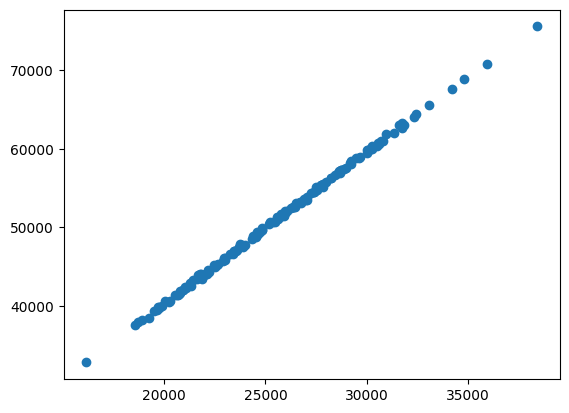

In [ ]:
x = 10 * df_train['owner_payable'].astype(int)
y = 2 * x - 5 + df_kmeans['owner_profit'].astype(int)
print(x)
plt.scatter(x, y);

<ipython-input-64-45202d06b971>:2: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  model.fit(x[:, np.newaxis], y)


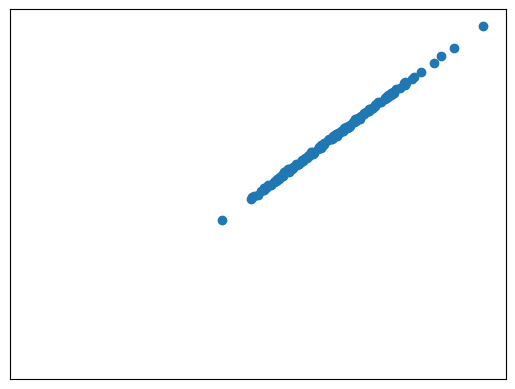

In [ ]:
model = LinearRegression(fit_intercept=True)
model.fit(x[:, np.newaxis], y)

xfit = np.linspace(0, 10, 1000)
yfit = model.predict(xfit[:, np.newaxis])
plt.scatter(x, y)
plt.plot(xfit, yfit,color='blue', linewidth=3);

plt.xticks(())
plt.yticks(())

plt.show()

In [ ]:
df_linear = df_train.filter(items=['EstSF','TotB','YrBlt','2_year_price_prediction','Zip_x','SellingPrice']).astype(int)
x = df_linear[['EstSF','TotB','YrBlt','Zip_x','SellingPrice']]

y = df_linear['2_year_price_prediction']


from sklearn.linear_model import LinearRegression
clf = LinearRegression()
clf.fit(x, y)

pred=clf.predict(x)
clf.score(x,y)
clf.predict(np.array([[1007,2,1970,91902, 290000]]))

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([309188.56381622])

**Here we get the average selling price in the market from the given data using linear regression**

# **Showing the market trends and highlighting the low, medium and high values houses using K-means, gmm and fractal clustering.**

Done By Namratha K


These are the zipcode wise trend of the house price rates in the market.

In [ ]:
trend = (
    df_train
    .groupby('Zip_x')
    .agg({"price_rise_predicted":"mean"})
    .sort_values('price_rise_predicted')
    .reset_index()
)

trend

,Zip_x,price_rise_predicted
0,92101,1.500000
1,92677,2.600000
2,91914,3.600000
3,92110,3.671429
4,92103,3.871429
5,92106,4.600000
6,92010,4.700000
7,92009,4.900000
8,92011,4.900000
9,92131,5.000000


In [ ]:
df_kmeans = df_train.filter(items=['Zip_x','price_rise_predicted'])
df_kmeans.head()

,Zip_x,price_rise_predicted
0,91902,5.8
1,91910,6.4
2,91914,3.6
3,91914,3.6
4,91914,3.6


Observe an "elbow" point, which represents the optimal number of clusters for your dataset. The elbow point is where the rate of decrease in WCSS starts to slow down. The optimal number of clusters is often chosen as the value of k where the WCSS begins to level off, indicating that additional clusters do not explain much more of the variance in the data.

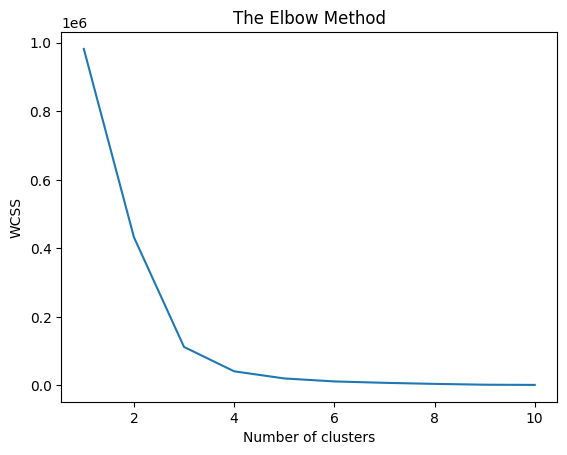

In [ ]:
from sklearn.cluster import KMeans
wcss = []
for i in range(1,11):
    kmeans = KMeans(n_clusters=i,init='k-means++',max_iter=300,n_init=10,random_state=0)
    kmeans.fit(df_kmeans)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,11),wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [ ]:
kmeans = KMeans(n_clusters=3,init='k-means++',max_iter=300,n_init=10,random_state=0)
y_kmeans = kmeans.fit_predict(df_kmeans)

Displays cluster centers as green points on the plot to visualize the trend in predicted price rates across different zip codes.

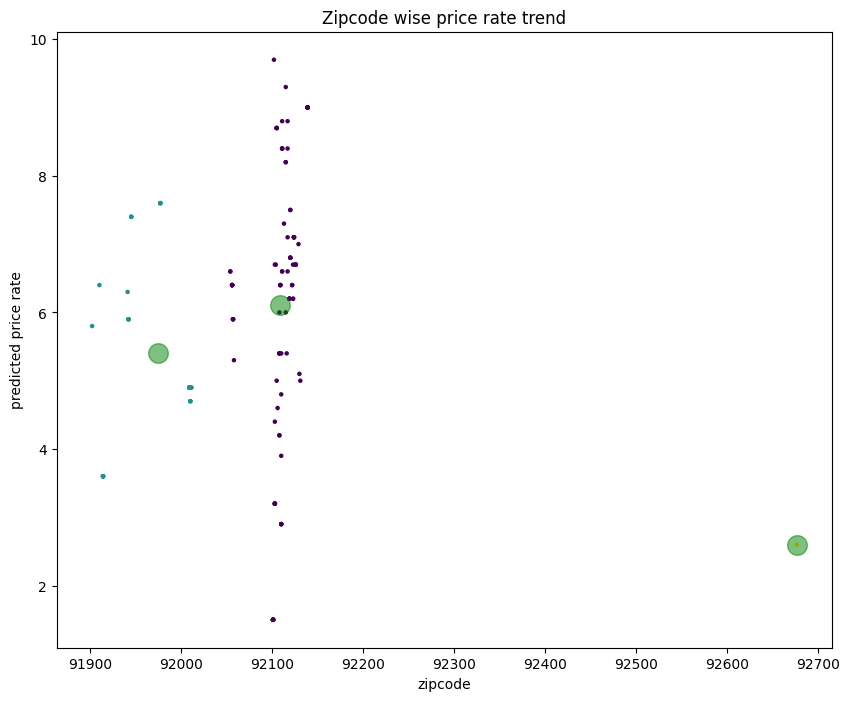

In [ ]:
plt.subplots(figsize=(10, 8))
plt.scatter(df_kmeans['Zip_x'].values, df_kmeans['price_rise_predicted'].values, c=y_kmeans, s=5, cmap='viridis')
km_centers = kmeans.cluster_centers_
plt.title('Zipcode wise price rate trend')
plt.xlabel('zipcode')
plt.ylabel('predicted price rate')
plt.scatter(km_centers[:, 0], km_centers[:, 1], c='g', s=200, alpha=0.5);

We created a scatter plot to visualize the relationship between predicted price rates and zip codes, with clustered data points colored by the `y_kmeans` clustering results, and superimposed green cluster centers for insight into price rate trends across zip codes.

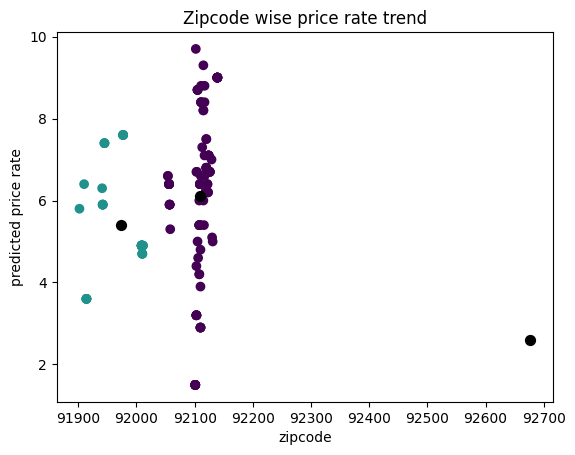

In [ ]:
plt.scatter(df_kmeans['Zip_x'], df_kmeans['price_rise_predicted'],
           c=y_kmeans, cmap ='viridis')

plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=50, c='black', label = 'Centroids')
plt.title('Zipcode wise price rate trend')
plt.xlabel('zipcode')
plt.ylabel('predicted price rate')
plt.show()


This code defines a function to analyze K-Means clustering performance by computing within-cluster SSE and silhouette scores, then visualizes these metrics to determine the optimal number of clusters.

In [ ]:
def plot_kmeans_cluster(df, max_loop=50):
    """
    Looking at the performance of various number of clusters using K-Means.
    Performance is evaluated by within cluster SSE and silhouette score.
    """
    try:
        df.drop('cluster', axis=1, inplace=True)
    except:
        next
    # X = df.iloc[:,1:]
    X = df.iloc[:,[1,16]].values

    # robust scaling is used so that the centering and scaling statistics are therefore not influenced by a few number of very large marginal outliers as they are based on percentiles
    rb = RobustScaler()
    X_rb = rb.fit_transform(X)

    sse_within_cluster = {}
    silhouette_score = {}

    for k in range(2, max_loop):
        kmeans = KMeans(n_clusters=k,  random_state=10, n_init=10)
        kmeans.fit(X_rb)
        sse_within_cluster[k] = kmeans.inertia_
        silhouette_score[k] = metrics.silhouette_score(X_rb, kmeans.labels_, random_state=10)

    _ = plt.figure(figsize=(10,6))
    ax1 = plt.subplot(211)
    _ = plt.plot(list(sse_within_cluster.keys()), list(sse_within_cluster.values()))
    _ = plt.xlabel("Number of Clusters")
    _ = plt.ylabel("SSE Within Cluster")
    _ = plt.title("Within Cluster SSE After K-Means Clustering")
    _ = plt.xticks([i for i in range(2, max_loop)], rotation=75)

    ax2 = plt.subplot(212)
    _ = plt.plot(list(silhouette_score.keys()), list(silhouette_score.values()))
    _ = plt.xlabel("Number of Clusters")
    _ = plt.ylabel("Silhouette Score")
    _ = plt.title("Silhouette Score After K-Means Clustering")
    _ = plt.xticks([i for i in range(2, max_loop)], rotation=75)

    plt.subplots_adjust(top=0.92, bottom=0.08, left=0.10, right=0.95, hspace=0.5, wspace=0.35)

This code defines a function called `apply_kmeans_cluster` that applies the K-Means clustering algorithm to a given dataset with a specified number of clusters, calculates the silhouette score, plots the data points with clusters, and prints clustering performance metrics, including the silhouette score and within-cluster SSE.

In [ ]:
def apply_kmeans_cluster(df, clusters=2):
    """
    Applying K-Means with the optimal number of clusters identified
    """
    try:
        df.drop('cluster', axis=1, inplace=True)
    except:
        next
    # X = df.iloc[:,1:]
    X = df.iloc[:, [1,16]].values

    X = X.astype(int)

    rb = RobustScaler()
    X_rb = rb.fit_transform(X)
    kmeans = KMeans(n_clusters = clusters, init = 'k-means++', random_state = 42)
    y_kmeans = kmeans.fit_predict(X_rb)

    score = metrics.silhouette_score(X_rb, kmeans.labels_, random_state=10)
    df['cluster'] = kmeans.labels_
    sse_within_cluster = kmeans.inertia_

    plt.subplots(figsize=(10, 8))
    plt.scatter(X_rb[:,0], X_rb[:,1], c=kmeans.labels_, s=15, cmap='viridis')
    km_centers = kmeans.cluster_centers_
    plt.title('Listing Price and Profit')
    plt.xlabel('Listing Price')
    plt.ylabel('Profit Per Month')
    plt.scatter(km_centers[:,0], km_centers[:,1], marker=",", color='r', s=150)


    print("clustering performance")
    print("-----------------------------------")
    print("silhouette score: " + str(score.round(2)))
    print("sse withing cluster: " + str(sse_within_cluster))

    return df

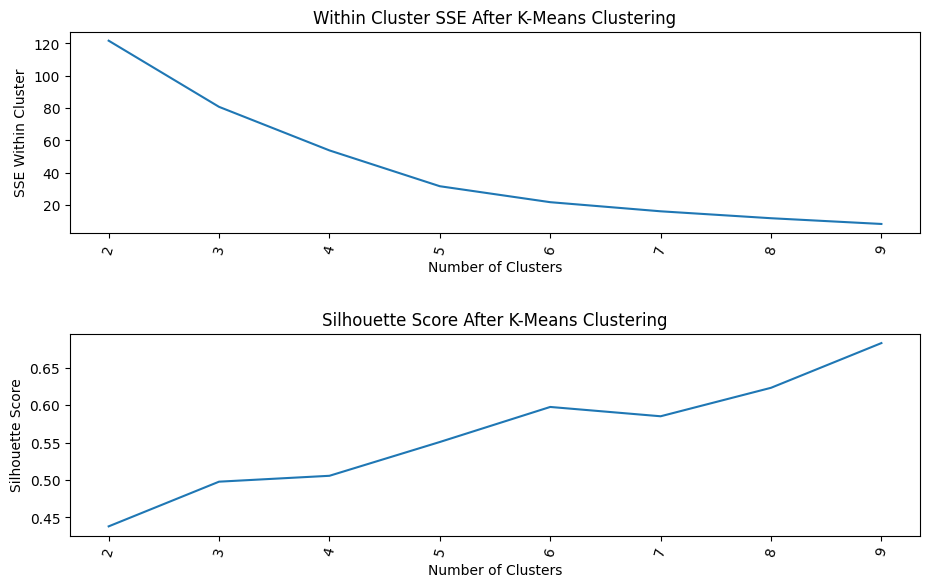

In [ ]:
plot_kmeans_cluster(df_train, max_loop=10)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


clustering performance
-----------------------------------
silhouette score: 0.55
sse withing cluster: 63.042211699883566


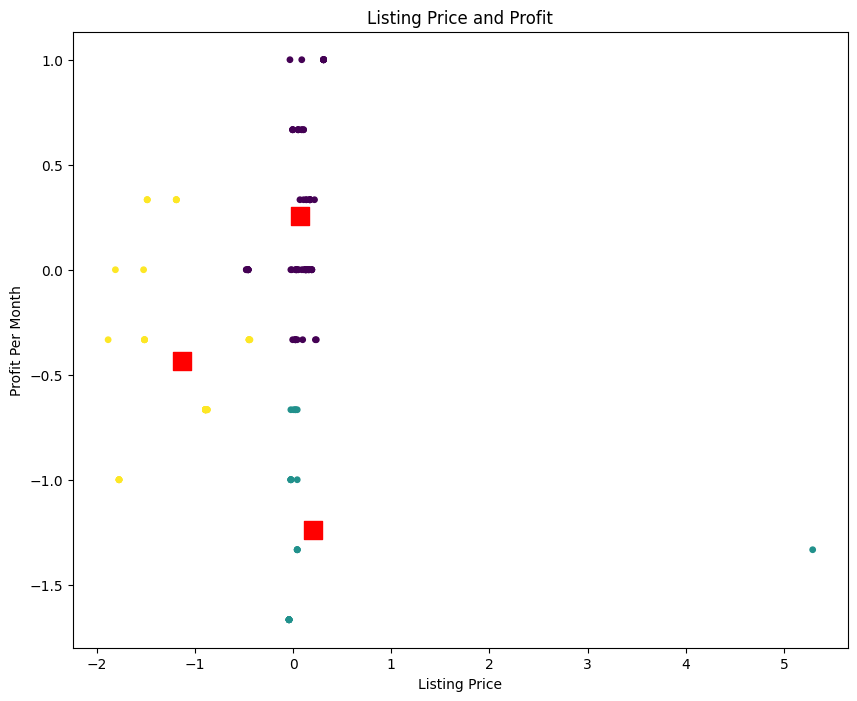

In [ ]:
first_trial_kmeans = apply_kmeans_cluster(df_train, clusters=3)

This DataFrame summarizes the performance of clusters obtained from a K-Means clustering process. It includes information such as cluster labels (cluster), the count of data points in each cluster (Zip_x), the mean of the predicted price rise values (price_rise_predicted), and the mean of list prices (ListPrice) within each cluster.

In [ ]:
cluster_perf_df_kmeans = (
    first_trial_kmeans
    .groupby('cluster')
    .agg({"Zip_x":"count", "price_rise_predicted":"mean","ListPrice":"mean"})
    .sort_values('Zip_x')
    .reset_index()
)

cluster_perf_df_kmeans

,cluster,Zip_x,price_rise_predicted,ListPrice
0,1,25,2.792000,498219.960000
1,2,43,5.444186,435758.046512
2,0,80,7.126250,419744.012500


* Based on the above values we can conclude that
* These 80 housing properties are the high value houses based on market trends

In [ ]:
df_train.query("cluster == 2")

,Address,Zip_x,Beds,TotB,EstSF,YrBlt,ListPrice,Lst Date,Parking,HOA,...,SellingPrice,price_rise_rate,price_rise_predicted,med_neghbhood_price_rate,MedianZestimate,2_year_prediction_rate,2_year_price_prediction,owner_payable,owner_profit,cluster
0,4095 Bonita Road 132,91902,2,2,1007,1970,310000.0,8/15/2018,NaN,470.0,...,290000.0,5.9,5.8,59.7,720041.0,5.701695,306534.915254,2187.0,-237.0,2
1,88 Fourth Ave 10,91910,3,2,1611,2004,399900.0,5/6/2018,2.0,320.0,...,405000.0,6.5,6.4,3.0,525698.0,6.301538,430521.230769,2382.0,168.0,2
2,2167 Palo Alto Dr 133,91914,2,2,1061,2006,374000.0,6/29/2018,1.0,127.0,...,400000.0,6.5,3.6,43.4,706252.0,1.993846,407975.384615,1974.0,226.0,2
3,2134 Cantata Dr. 36,91914,2,2,1061,2006,379000.0,7/30/2018,2.0,358.0,...,368000.0,6.5,3.6,47.9,706252.0,1.993846,375337.353846,2299.0,-99.0,2
4,280 Salinas Dr. 171,91914,2,2,1061,2006,372000.0,7/10/2018,2.0,125.0,...,374000.0,6.5,3.6,7.0,706252.0,1.993846,381456.984615,1858.0,382.0,2
5,2360 Corte Pescado 88,91914,3,3,1285,2006,399000.0,8/3/2018,2.0,324.0,...,400000.0,6.5,3.6,43.4,706252.0,1.993846,407975.384615,2368.0,127.0,2
6,2340 Corte Flores 98,91914,4,3,1468,2006,419000.0,8/15/2018,2.0,324.0,...,427000.0,6.5,3.6,39.5,706252.0,1.993846,435513.723077,2484.0,216.0,2
12,3880 Murray Hill Rd,91941,3,2,1398,1991,525000.0,7/2/2018,4.0,260.0,...,495000.0,5.9,6.3,7.0,678503.0,6.727119,528299.237288,2649.0,146.0,2
14,5700 Baltimore Dr 241,91942,2,3,1068,1976,325000.0,7/15/2018,NaN,416.0,...,317000.0,5.9,5.9,43.5,560916.0,5.900000,335703.000000,2195.0,5.0,2
16,7780 Parkway Dr 1001,91942,3,2,1321,1982,390000.0,7/26/2018,2.0,420.0,...,375000.0,5.9,5.9,33.1,560916.0,5.900000,397125.000000,2453.0,-103.0,2


* These 43 housing properties are the average value houses based on market trends

In [ ]:
df_train.query("cluster == 0")

,Address,Zip_x,Beds,TotB,EstSF,YrBlt,ListPrice,Lst Date,Parking,HOA,...,SellingPrice,price_rise_rate,price_rise_predicted,med_neghbhood_price_rate,MedianZestimate,2_year_prediction_rate,2_year_price_prediction,owner_payable,owner_profit,cluster
76,552 Canyon Drive 24,92054,3,2,1035,1991,315000.0,6/30/2018,2.0,460.0,...,300000.0,6.0,6.6,58.7,726346.0,7.260000,321780.000000,2210.0,-60.0,0
79,910 N Pacific Street 40,92054,2,2,1226,1976,509900.0,6/15/2018,1.0,595.0,...,461500.0,6.0,6.6,36.5,726346.0,7.260000,495004.900000,3175.0,-180.0,0
80,3538 Paseo de los Americanos 129,92056,2,2,1093,1989,349900.0,8/7/2018,NaN,321.0,...,332000.0,6.0,6.4,41.3,565352.0,6.826667,354664.533333,2070.0,30.0,0
82,100 Sea Cliff Way 106,92056,2,2,1030,1990,379000.0,7/25/2018,2.0,385.0,...,365000.0,6.0,6.4,35.4,565352.0,6.826667,389917.333333,2340.0,-190.0,0
83,3555 Cameo Dr 64,92056,2,2,1008,1992,389999.0,8/8/2018,1.0,325.0,...,372000.0,6.0,6.4,34.2,565352.0,6.826667,397395.200000,2250.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
240,7076 Attleborough Ct,92139,3,2,1568,1981,425000.0,5/24/2018,4.0,128.0,...,440000.0,6.0,9.0,11.8,499077.0,13.500000,499400.000000,2144.0,506.0,0
241,1886 Manzana Way,92139,4,3,1555,1986,435000.0,8/15/2018,2.0,172.0,...,425000.0,6.0,9.0,14.8,499077.0,13.500000,482375.000000,2168.0,632.0,0
242,7019 DEERHURST CT,92139,3,2,1381,1980,425000.0,8/9/2018,2.0,134.0,...,405000.0,6.0,9.0,18.9,499077.0,13.500000,459675.000000,2006.0,494.0,0
243,2233 Manzana Way,92139,4,3,1701,1985,460000.0,8/10/2018,4.0,235.0,...,463500.0,6.0,9.0,1.0,499077.0,13.500000,526072.500000,2459.0,291.0,0


* These 25 housing properties are the low value houses based on market trends

In [ ]:
df_train.query("cluster == 2")

,Address,Zip_x,Beds,TotB,EstSF,YrBlt,ListPrice,Lst Date,Parking,HOA,...,SellingPrice,price_rise_rate,price_rise_predicted,med_neghbhood_price_rate,MedianZestimate,2_year_prediction_rate,2_year_price_prediction,owner_payable,owner_profit,cluster
0,4095 Bonita Road 132,91902,2,2,1007,1970,310000.0,8/15/2018,NaN,470.0,...,290000.0,5.9,5.8,59.7,720041.0,5.701695,306534.915254,2187.0,-237.0,2
1,88 Fourth Ave 10,91910,3,2,1611,2004,399900.0,5/6/2018,2.0,320.0,...,405000.0,6.5,6.4,3.0,525698.0,6.301538,430521.230769,2382.0,168.0,2
2,2167 Palo Alto Dr 133,91914,2,2,1061,2006,374000.0,6/29/2018,1.0,127.0,...,400000.0,6.5,3.6,43.4,706252.0,1.993846,407975.384615,1974.0,226.0,2
3,2134 Cantata Dr. 36,91914,2,2,1061,2006,379000.0,7/30/2018,2.0,358.0,...,368000.0,6.5,3.6,47.9,706252.0,1.993846,375337.353846,2299.0,-99.0,2
4,280 Salinas Dr. 171,91914,2,2,1061,2006,372000.0,7/10/2018,2.0,125.0,...,374000.0,6.5,3.6,7.0,706252.0,1.993846,381456.984615,1858.0,382.0,2
5,2360 Corte Pescado 88,91914,3,3,1285,2006,399000.0,8/3/2018,2.0,324.0,...,400000.0,6.5,3.6,43.4,706252.0,1.993846,407975.384615,2368.0,127.0,2
6,2340 Corte Flores 98,91914,4,3,1468,2006,419000.0,8/15/2018,2.0,324.0,...,427000.0,6.5,3.6,39.5,706252.0,1.993846,435513.723077,2484.0,216.0,2
12,3880 Murray Hill Rd,91941,3,2,1398,1991,525000.0,7/2/2018,4.0,260.0,...,495000.0,5.9,6.3,7.0,678503.0,6.727119,528299.237288,2649.0,146.0,2
14,5700 Baltimore Dr 241,91942,2,3,1068,1976,325000.0,7/15/2018,NaN,416.0,...,317000.0,5.9,5.9,43.5,560916.0,5.900000,335703.000000,2195.0,5.0,2
16,7780 Parkway Dr 1001,91942,3,2,1321,1982,390000.0,7/26/2018,2.0,420.0,...,375000.0,5.9,5.9,33.1,560916.0,5.900000,397125.000000,2453.0,-103.0,2


#Classification

Done By Nohar Reddy Gurrala


**Logistic Regression**

In [ ]:
from sklearn.linear_model import LinearRegression

In [ ]:
reg = LinearRegression()
reg

LinearRegression()

In [ ]:
df_train.insert(24, "profit_score", 0)

In [ ]:
for i,data in enumerate(df['owner_profit']):
  if data > 0:
    df_train["profit_score"][i] = 1
  else:
    df_train["profit_score"][i] = 0

print(df)

                    Address  Zip_x  Beds  TotB  EstSF  YrBlt  ListPrice  \
0      4095 Bonita Road 132  91902     2     2   1007   1970   310000.0   
1         88 Fourth Ave  10  91910     3     2   1611   2004   399900.0   
2     2167 Palo Alto Dr 133  91914     2     2   1061   2006   374000.0   
3       2134 Cantata Dr. 36  91914     2     2   1061   2006   379000.0   
4       280 Salinas Dr. 171  91914     2     2   1061   2006   372000.0   
..                      ...    ...   ...   ...    ...    ...        ...   
242       7019 DEERHURST CT  92139     3     2   1381   1980   425000.0   
243        2233 Manzana Way  92139     4     3   1701   1985   460000.0   
244  24374 Larchmont Ct  69  92653     2     3   1288   1985   499000.0   
245     25185 Via Terracina  92677     2     2   1113   1989   515000.0   
246    3575 Cameo Drive  43  92056     3     2   1141   1992   399000.0   

      Lst Date  Parking    HOA  ...      SldDte  SellingPrice price_rise_rate  \
0    8/15/2018    

<ipython-input-95-86d67ec0005b>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train["profit_score"][i] = 0
<ipython-input-95-86d67ec0005b>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train["profit_score"][i] = 1
<ipython-input-95-86d67ec0005b>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train["profit_score"][i] = 0
<ipython-input-95-86d67ec0005b>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of

In [ ]:
df['profit_score'] = df_train['profit_score']

In [ ]:
df_reg = df_train.filter(items=['ListPrice','Rent','HOA','Mortgage','owner_payable','owner_profit','profit_score','SellingPrice'])
X = df_reg.drop('SellingPrice', axis=1)
y = df_reg.iloc[:, [7]]

In [ ]:
reg.fit(X, y)

LinearRegression()

In [ ]:
pred=reg.predict(X)

In [ ]:
from sklearn import metrics
metrics.r2_score(y, pred)

0.9997565900008677

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
df_reg = df_train.filter(items=['ListPrice','EstSF','YrBlt','Rent','HOA','Mortgage','price_rise_rate','owner_payable','owner_profit','profit_score','SellingPrice']).astype(int)
X = df_reg.drop('SellingPrice', axis=1)
y = df_reg.iloc[:,[10]]

clf= LogisticRegression(max_iter=100)
clf


LogisticRegression()

In [ ]:
clf.fit(X, y)

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [ ]:
pred = clf.predict(X)

In [ ]:
metrics.accuracy_score(y, pred)

0.20945945945945946

In [ ]:
print('\nResult : 0 - House with Loss')
print('Result : 1 - House with Profit')

print('\n\nExample 1 : ListPrice: 310000, Rent : 1950, Owner Payments : 2187 Per Month Profit : -237.0')
print("Predicted Selling Price : ",clf.predict(np.array([[310000,1007,1970,1950,470,1717,5.9,2187,-237,0]])))

print('\n\nExample 2 : ListPrice: 399900, Rent : 2550, Owner Payments : 2382 Per Month Profit : 168.0')
print("Predicted Selling Price : ",clf.predict(np.array([[399900,1611,2004,2550,320,2062,6.5,2382,168,1]])))

print('\n\nExample 3 : ListPrice: 374000, Rent : 2200, Owner Payments : 1974 Per Month Profit : 226.0')
print("Predicted Selling Price : ",clf.predict(np.array([[374000,1061,2006,2200,127,1847,6.5,1974,226,1]])))

print('\n\nExample 4 : ListPrice: 379000, Rent : 2200, Owner Payments : 2299 Per Month Profit : -99.0')
print("Predicted Selling Price : ",clf.predict(np.array([[379000,1061,2006,2200,358,1941,6.5,2299,-99,0]])))


Result : 0 - House with Loss
Result : 1 - House with Profit


Example 1 : ListPrice: 310000, Rent : 1950, Owner Payments : 2187 Per Month Profit : -237.0
Predicted Selling Price :  [320000]


Example 2 : ListPrice: 399900, Rent : 2550, Owner Payments : 2382 Per Month Profit : 168.0
Predicted Selling Price :  [372000]


Example 3 : ListPrice: 374000, Rent : 2200, Owner Payments : 1974 Per Month Profit : 226.0
Predicted Selling Price :  [365000]


Example 4 : ListPrice: 379000, Rent : 2200, Owner Payments : 2299 Per Month Profit : -99.0
Predicted Selling Price :  [370000]


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


**Decision Tree**

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import preprocessing

In [ ]:
clf = DecisionTreeClassifier(max_depth = 3, criterion='gini', random_state = 0)
clf

DecisionTreeClassifier(max_depth=3, random_state=0)

In [ ]:
X = df_train[['owner_payable']]

lab_enc = preprocessing.LabelEncoder()
encoded = lab_enc.fit_transform(df_train['owner_profit'])
y = encoded

In [ ]:
clf.fit(X,y)

DecisionTreeClassifier(max_depth=3, random_state=0)

In [ ]:
pred = clf.predict(X)

In [ ]:
metrics.accuracy_score(y, pred)

0.08108108108108109

**Random Forest**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn import preprocessing

In [ ]:
clf = RandomForestClassifier()
clf

RandomForestClassifier()

In [ ]:
clf.fit(X,y)

RandomForestClassifier()

In [ ]:
pred= clf.predict(X)
metrics.accuracy_score(y, pred)

0.9527027027027027

In [ ]:
X = df_reg.drop('owner_profit', axis=1).astype(int)

In [ ]:
clf.fit(X, y)
pred = clf.predict(X)
metrics.accuracy_score(y, pred)

1.0

In [ ]:
estimator = clf.estimators_[5]

In [ ]:
!pip3 install --upgrade scikit-learn
!pip3 install --upgrade IPython.display
!pip3 install --upgrade sklearn.tree
!pip3 install pydotplus
!pip3 install --upgrade io

ERROR: Could not find a version that satisfies the requirement IPython.display (from versions: none)
ERROR: No matching distribution found for IPython.display
ERROR: Could not find a version that satisfies the requirement sklearn.tree (from versions: none)
ERROR: No matching distribution found for sklearn.tree
ERROR: Could not find a version that satisfies the requirement io (from versions: none)
ERROR: No matching distribution found for io


**Ploting a Decision Binary Tree**

In [ ]:
from io import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
# Export as dot file
export_graphviz(estimator,
                out_file=dot_data,
                rounded = True, filled = True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

# Classifier Comparision and  Feature transformation with RBF function

Done By Nohar Reddy Gurrala and Namratha K

In [ ]:
!pip install scikit-learn
!pip install matplotlib
!pip install xgboost
!pip install numpy
!pip install seaborn
!pip install yellowbrick

In [ ]:
!pip uninstall scikit-learn
!pip install scikit-learn

Found existing installation: scikit-learn 1.3.1
Uninstalling scikit-learn-1.3.1:
  Would remove:
    /usr/local/lib/python3.10/dist-packages/scikit_learn-1.3.1.dist-info/*
    /usr/local/lib/python3.10/dist-packages/scikit_learn.libs/libgomp-a34b3233.so.1.0.0
    /usr/local/lib/python3.10/dist-packages/sklearn/*
Proceed (Y/n)? ERROR: Operation cancelled by user
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/base_command.py", line 180, in exc_logging_wrapper
    status = run_func(*args)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/commands/uninstall.py", line 105, in run
    uninstall_pathset = req.uninstall(
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/req/req_install.py", line 687, in uninstall
    uninstalled_pathset.remove(auto_confirm, verbose)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/req/req_uninstall.py", line 375, in remove
    if auto_confirm or self._allowed_to_proceed(

In [ ]:
  from sklearn.gaussian_process.kernels import RBF
  from sklearn.preprocessing import StandardScaler
  from matplotlib.colors import ListedColormap
  import time
  import xgboost as xgb
  from xgboost import XGBClassifier
  import sklearn.datasets as data
  import numpy as np
  import matplotlib.pyplot as plt
  from matplotlib.colors import ListedColormap
  from sklearn.model_selection import train_test_split
  from sklearn.preprocessing import StandardScaler
  from sklearn.datasets import make_moons, make_circles, make_classification
  from sklearn.neural_network import MLPClassifier
  from sklearn.neighbors import KNeighborsClassifier
  from sklearn.svm import SVC
  from sklearn.gaussian_process import GaussianProcessClassifier
  from sklearn.gaussian_process.kernels import RBF
  from sklearn.tree import DecisionTreeClassifier
  from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
  from sklearn.naive_bayes import GaussianNB
  from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
  import seaborn as sns
  from collections import Counter
  from yellowbrick import ROCAUC
  from yellowbrick.classifier import ConfusionMatrix, ClassificationReport

In [ ]:
def show_quarter(df, query, col, title, ax, bins, x_label=None, y_label=None):
                  results = df.query(query)
                  results[col].hist(ax=ax, bins=bins);
                  if y_label:
                      ax.set_ylabel(y_label)
                  if x_label:
                      ax.set_xlabel(x_label)
                  ax.set_title(title + " ({})".format(results.shape[0])) #IANBOB

# **Muller Loop**

Done By Venkata Murali Monish A and Rama Sai Gurunadh Dara


In [ ]:
classifierList = []

def featureTransformation(X_data_reshape,y_data):
  classifierList.clear()
  names = ["Nearest Neighbors", "Linear SVM", "RBF SVM", "Gaussian Process",
          "Decision Tree", "Random Forest", "Neural Net", "AdaBoost",
          "Naive Bayes", "QDA","XGB"]
  classifiers = [
      KNeighborsClassifier(2),
      SVC(kernel="linear", C=0.025),
      SVC(gamma=2, C=1),
      GaussianProcessClassifier(1.0 * RBF(1.0)),
      DecisionTreeClassifier(max_depth=5),
      RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
      MLPClassifier(alpha=1, max_iter=1000),
      AdaBoostClassifier(),
      GaussianNB(),
      QuadraticDiscriminantAnalysis(),XGBClassifier(scale_pos_weight=99)]

  datasets = [df]


  figure = plt.figure(figsize=(19, 7))
  i = 1
  # iterate over datasets
  for ds_cnt, ds in enumerate(datasets):
      # preprocess dataset, split into training and test part
      X, y = X_data_reshape, y_data

      X = StandardScaler().fit_transform(X)
      X_train, X_test, y_train, y_test = \
          train_test_split(X, y, test_size=.2)

      x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
      y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
      h=1
      xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                          np.arange(y_min, y_max, h))

      cm = plt.cm.RdBu
      cm_bright = ListedColormap(['#FF0000', '#0000FF'])
      ax = plt.subplot(len(datasets), len(classifiers) + 1, i)
      if ds_cnt == 0:
          ax.set_title("Input data")
      # Plot the training points
      ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train.values, cmap=cm_bright,
                edgecolors='k')
      # Plot the testing points
      ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test.values, cmap=cm_bright, alpha=0.6,
                edgecolors='k')
      ax.set_xlim(xx.min(), xx.max())
      ax.set_ylim(yy.min(), yy.max())
      ax.set_xlabel("Factors affecting Socioeconomic")
      ax.set_ylabel("Socioeconomic Status")
      ax.set_xticks(())
      ax.set_yticks(())
      i += 1
      # Using Muller Loop Algorithm
      max_score = 0.0
      max_class = ''
      # iterate over classifiers
      for name, clf in zip(names, classifiers):
          classifierMatrix = []
          start_time = time.time()
          clf.fit(X_train, y_train)
          score = 100.0 * clf.score(X_test, y_test)
          classifierMatrix.append(name)
          classifierMatrix.append(score)
          try:
              visualizer = ROCAUC(clf, micro=False, macro=False, per_class=True)
              visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
              learningCurve = visualizer.score(X_test, y_test) # Evaluate the model on the test data
              classifierMatrix.append(100.0 * learningCurve)
              g = visualizer.poof()
              plt.show()
          except Exception as e:
              #print("An exception occurred")
              visualizer = ROCAUC(clf, micro=False, macro=False, per_class=False)
              visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
              learningCurve = visualizer.score(X_test, y_test) # Evaluate the model on the test data
              classifierMatrix.append(100.0 * learningCurve)
              g = visualizer.poof()
              plt.show()
              #print(e)
          try:
              fig, ax = plt.subplots()
              cm = ConfusionMatrix(clf, classes=[0, 1], ax=ax)
              cm.fit(X_train, y_train)
              confusionMatrixScore = cm.score(X_test, y_test)
              classifierMatrix.append(100.0 * confusionMatrixScore)
              cm.poof()
              plt.show()

              clf.fit(X_train, y_train)
              y_pred_proba = clf.predict_proba(X_test)

              df_predictions = pd.DataFrame({'y': y_test, 'y_proba': y_pred_proba[:,1]})
              # classifierMatrix.append(y_pred_proba)
              fig, axs = plt.subplots(ncols=2, nrows=2, sharex=True, sharey=True)
              # show true-pos
              bins = np.arange(0, 1.01, 0.1)
              show_quarter(df_predictions, "y==0 and y_proba < 0.5", "y_proba", "True Negative", axs[0][0], bins, y_label="y==0")
              show_quarter(df_predictions, "y==0 and y_proba >= 0.5", "y_proba", "False Positive", axs[0][1], bins)
              show_quarter(df_predictions, "y==1 and y_proba >= 0.5", "y_proba", "True Positive", axs[1][1], bins, x_label="pred==1")
              show_quarter(df_predictions, "y==1 and y_proba < 0.5", "y_proba", "False Negative", axs[1][0], bins, x_label="pred==0", y_label="y==1")
              fig.suptitle("Probabilities per Confusion Matrix cell");
              plt.show()
          except Exception as e:
              print("An exception occurred")
              print(e)


          print('Classifier = %s, Score (test, accuracy) = %.2f,' %(name, score), 'Training time = %.2f seconds' % (time.time() - start_time))


          classifierMatrix.append(time.time() - start_time)
          classifierList.append(classifierMatrix)
          if score > max_score:
              clf_best = clf
              max_score = score
              max_class = name
      print(80*'-' )

      print('Best --> Classifier = %s, Score (test, accuracy) = %.2f' %(max_class, max_score))
      #plot the output of the various algorithms



In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

def classifierTable(classifierList):
    df = pd.DataFrame(classifierList, columns = ['Classifier', 'Accuracy Score',
                                        'Learning Score', 'Confusion Matrix Score',
                                        'Training Time(Sec)'] )

    df['Accuracy Score'] = df['Accuracy Score'].astype(float)
    df['Learning Score'] = df['Learning Score'].astype(float)
    df['Confusion Matrix Score'] = df['Confusion Matrix Score'].astype(float)


    df_sorted = df.sort_values(by=['Accuracy Score'],ascending=False)

    print('Classifier Comparison Table')
    from IPython.display import display, HTML

    # Assuming that dataframes df1 and df2 are already defined:
    print("Classifiers:")
    display(df_sorted)
    print('-----------------------------------------------')
    df_sorted.plot.bar(x='Classifier',rot=0, figsize=(16, 4))

In [ ]:
df_ml = df_train[['ListPrice','Rent','owner_profit','profit_score']].copy()

In [ ]:
X_data_reshape= df_ml.drop('profit_score', axis=1)
y_data = df_ml.iloc[:, [3]]

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


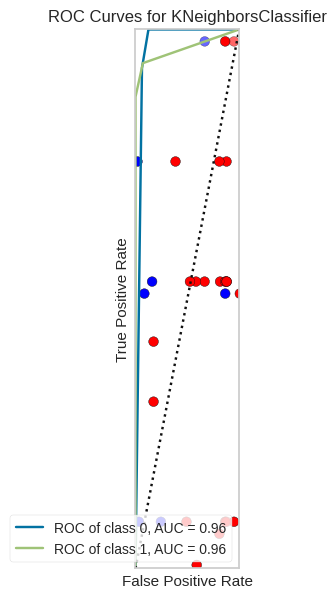

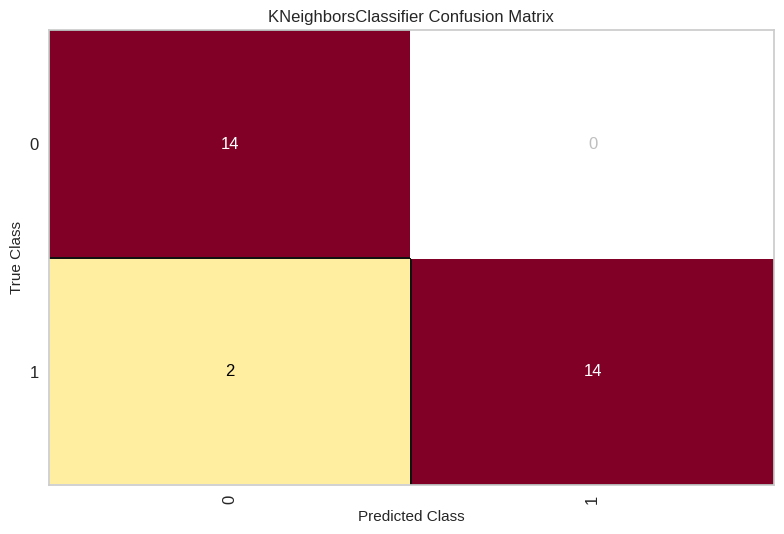

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


An exception occurred
Data must be 1-dimensional
Classifier = Nearest Neighbors, Score (test, accuracy) = 93.33, Training time = 1.10 seconds


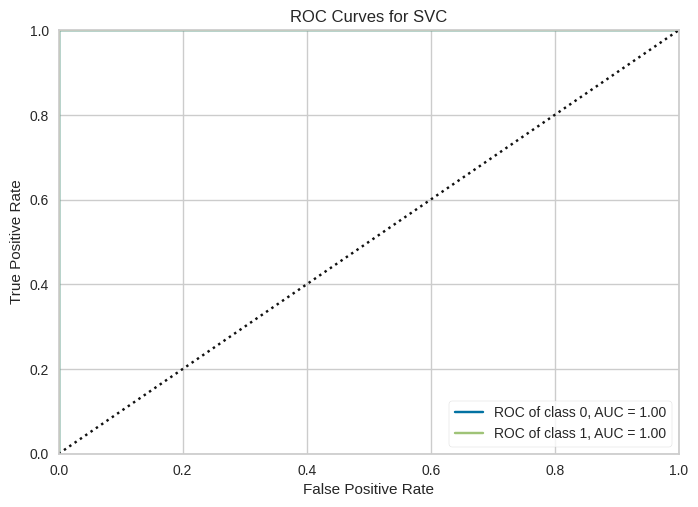

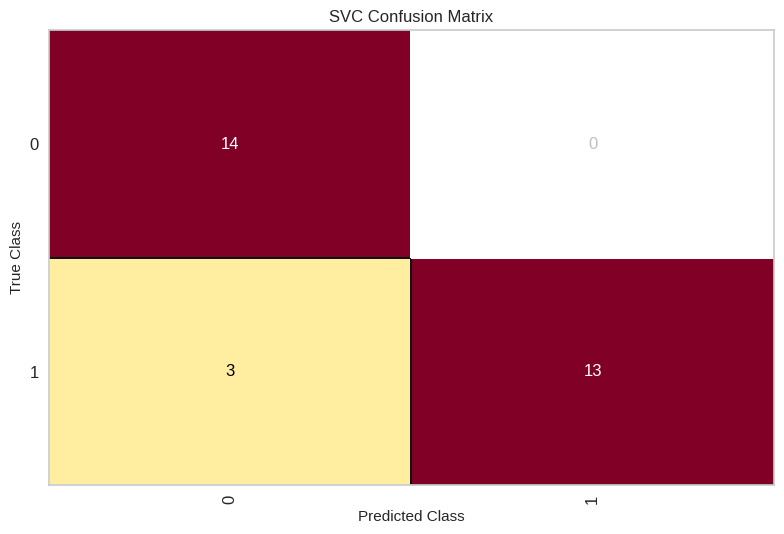

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


An exception occurred
predict_proba is not available when probability=False
Classifier = Linear SVM, Score (test, accuracy) = 90.00, Training time = 1.82 seconds


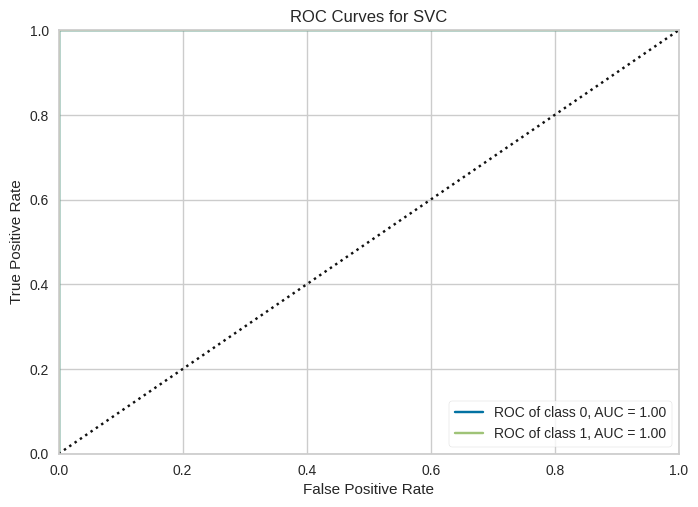

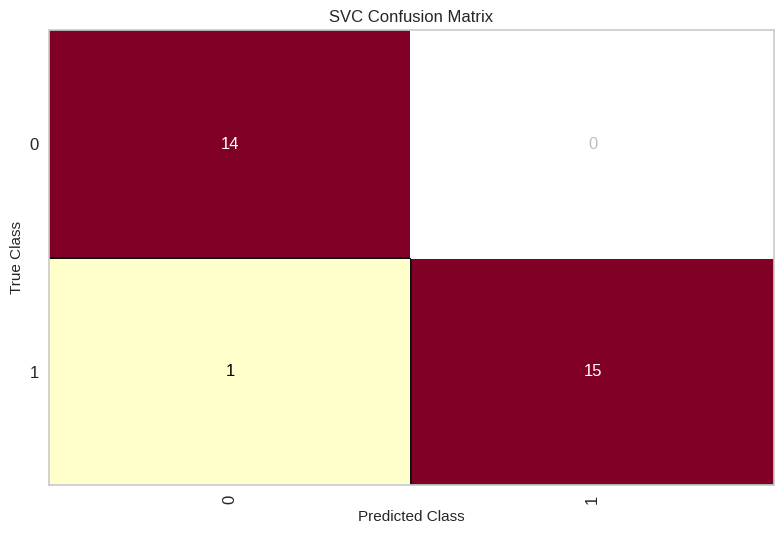

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


An exception occurred
predict_proba is not available when probability=False
Classifier = RBF SVM, Score (test, accuracy) = 96.67, Training time = 1.58 seconds


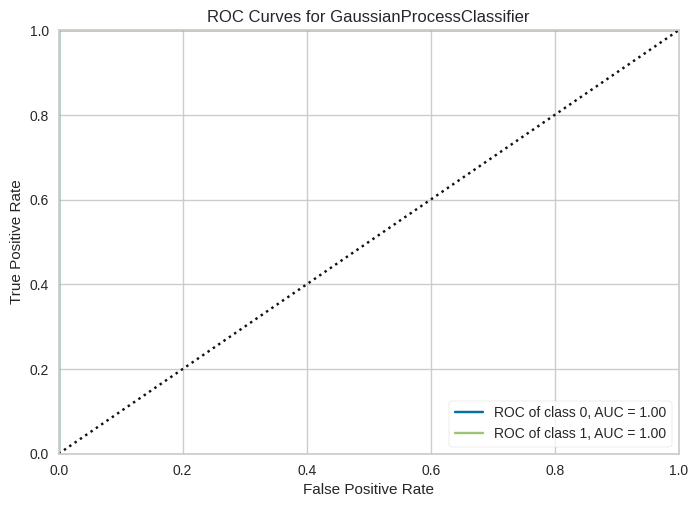

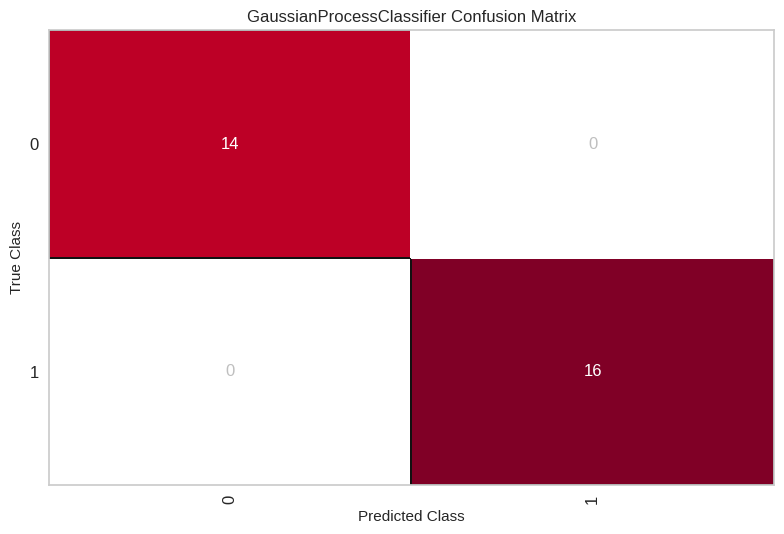

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


An exception occurred
Data must be 1-dimensional
Classifier = Gaussian Process, Score (test, accuracy) = 100.00, Training time = 2.42 seconds


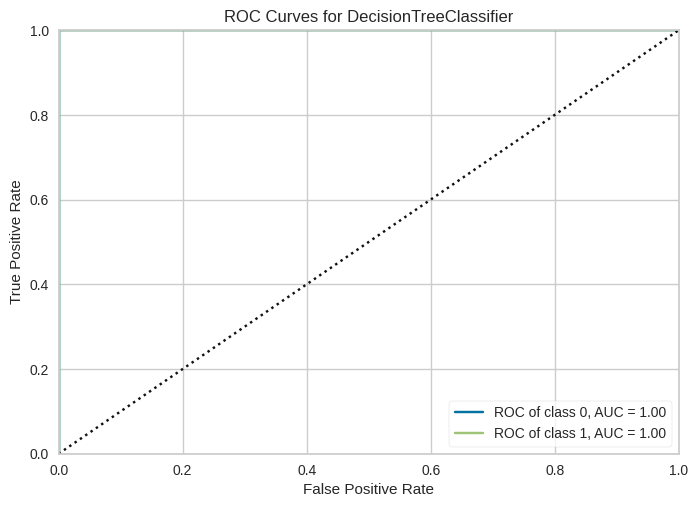

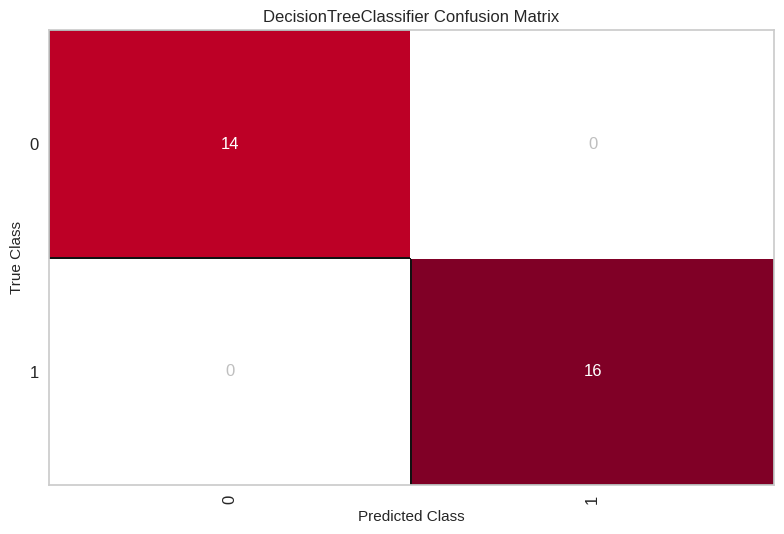

An exception occurred
Data must be 1-dimensional
Classifier = Decision Tree, Score (test, accuracy) = 100.00, Training time = 0.77 seconds


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


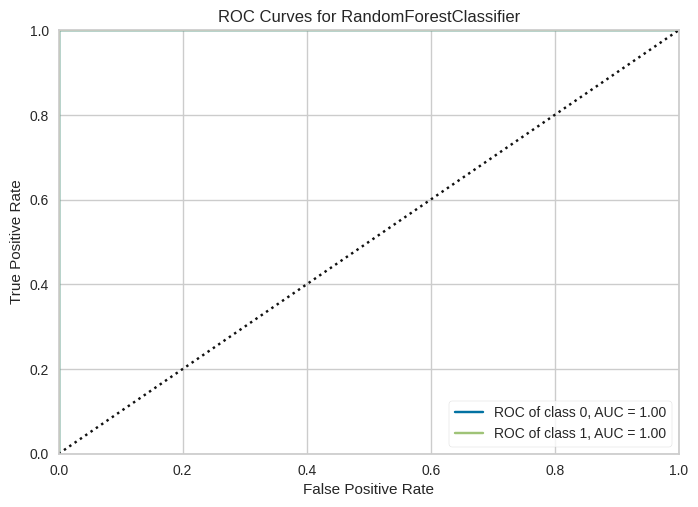

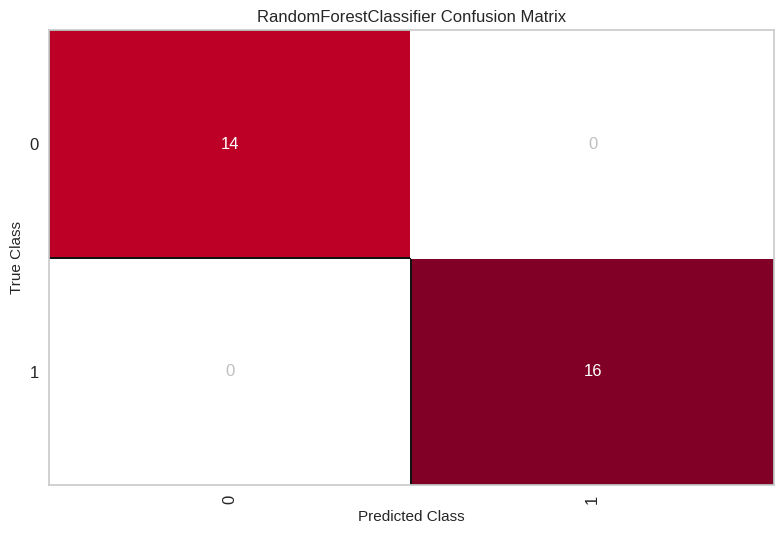

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


An exception occurred
Data must be 1-dimensional
Classifier = Random Forest, Score (test, accuracy) = 100.00, Training time = 0.55 seconds


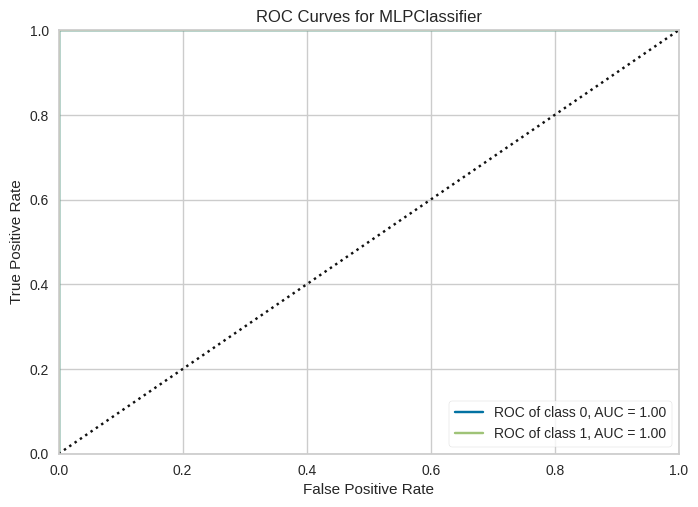

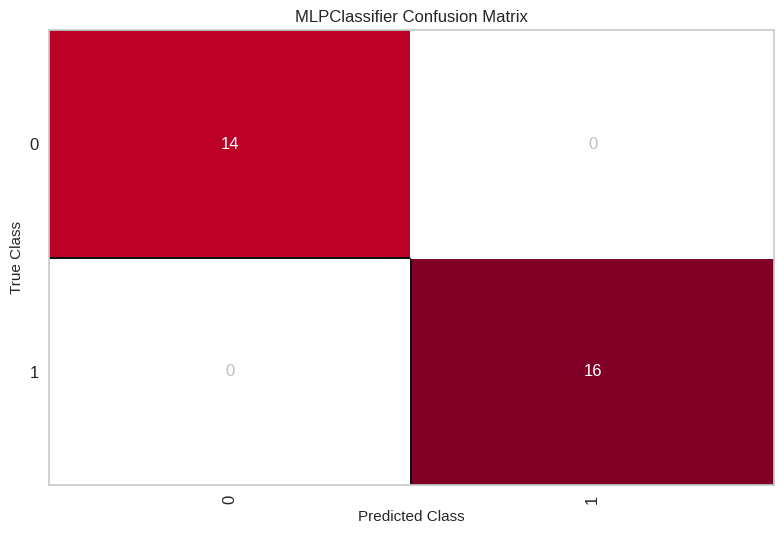

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


An exception occurred
Data must be 1-dimensional
Classifier = Neural Net, Score (test, accuracy) = 100.00, Training time = 1.28 seconds


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


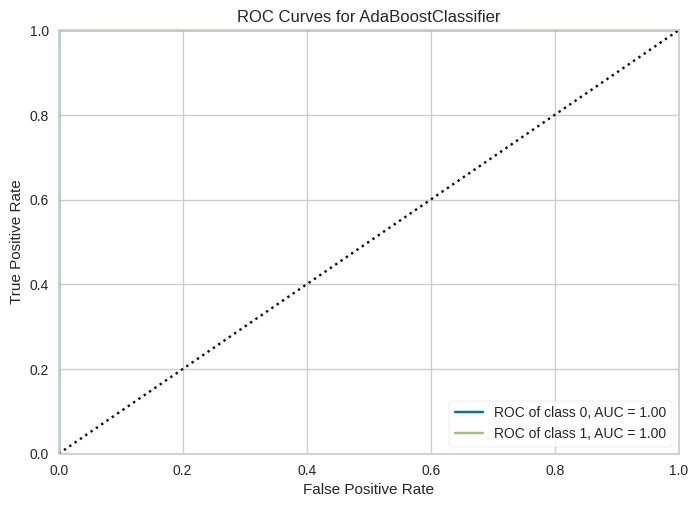

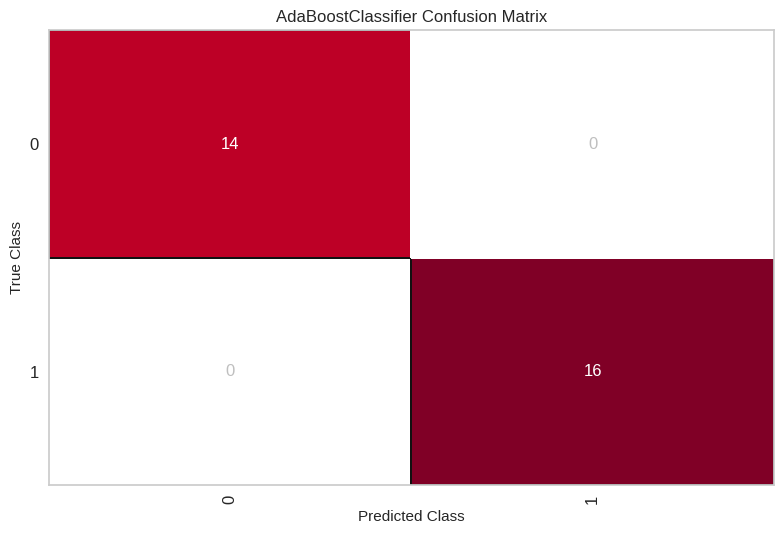

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


An exception occurred
Data must be 1-dimensional
Classifier = AdaBoost, Score (test, accuracy) = 100.00, Training time = 0.53 seconds


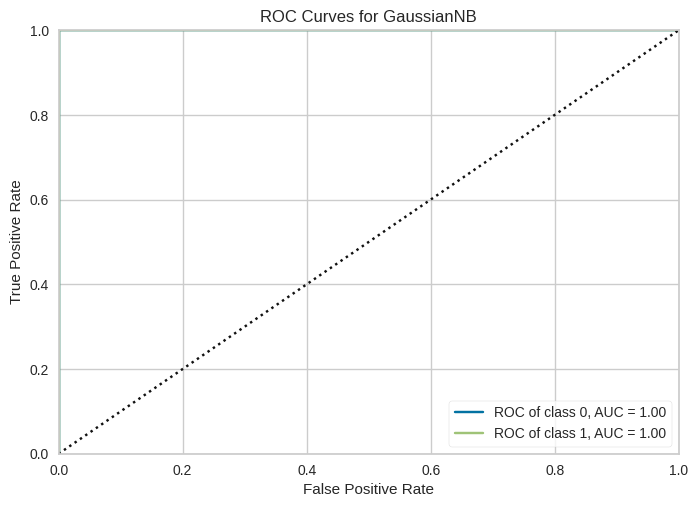

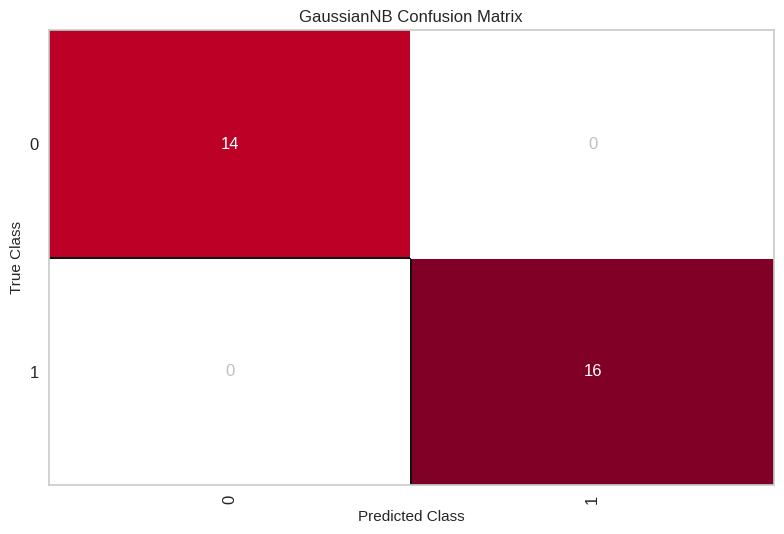

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


An exception occurred
Data must be 1-dimensional
Classifier = Naive Bayes, Score (test, accuracy) = 100.00, Training time = 0.52 seconds


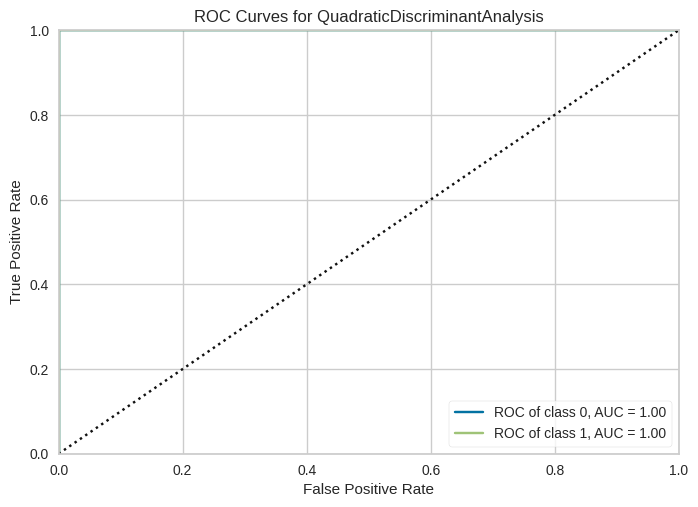

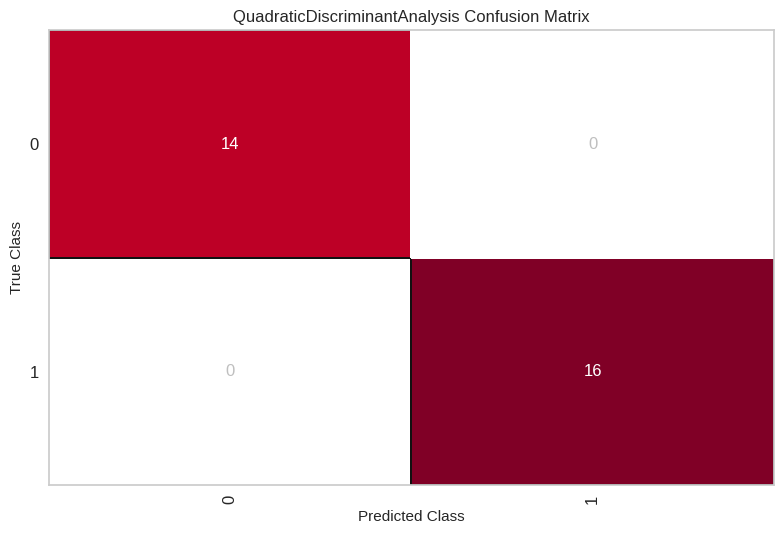

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


An exception occurred
Data must be 1-dimensional
Classifier = QDA, Score (test, accuracy) = 100.00, Training time = 0.52 seconds


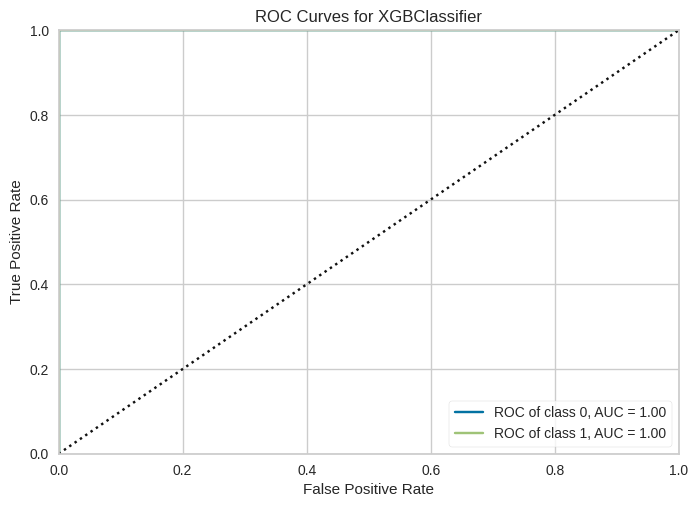

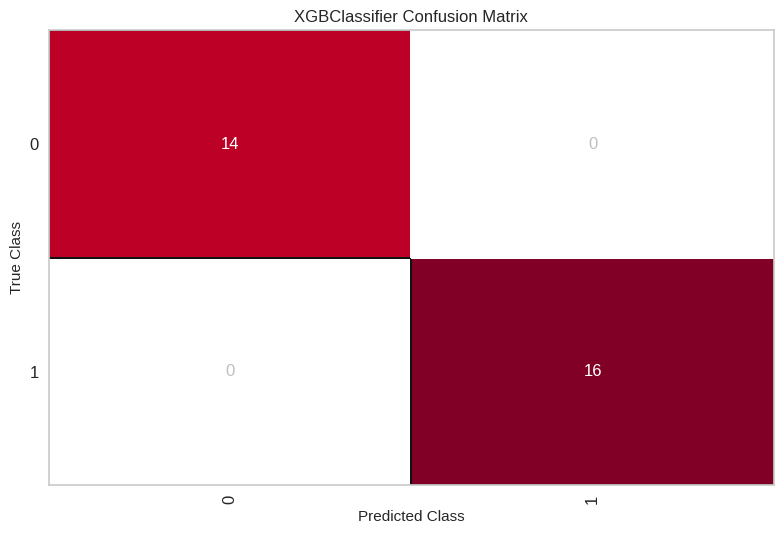

An exception occurred
Data must be 1-dimensional
Classifier = XGB, Score (test, accuracy) = 100.00, Training time = 0.64 seconds
--------------------------------------------------------------------------------
Best --> Classifier = Gaussian Process, Score (test, accuracy) = 100.00


In [ ]:
featureTransformation(X_data_reshape,y_data)

Classifier Comparison Table
Classifiers:


,Classifier,Accuracy Score,Learning Score,Confusion Matrix Score,Training Time(Sec)
3,Gaussian Process,100.000000,100.000000,100.000000,2.419691
4,Decision Tree,100.000000,100.000000,100.000000,0.770360
5,Random Forest,100.000000,100.000000,100.000000,0.554480
6,Neural Net,100.000000,100.000000,100.000000,1.278459
7,AdaBoost,100.000000,100.000000,100.000000,0.530515
8,Naive Bayes,100.000000,100.000000,100.000000,0.521362
9,QDA,100.000000,100.000000,100.000000,0.516014
10,XGB,100.000000,100.000000,100.000000,0.636536
2,RBF SVM,96.666667,96.666667,96.666667,1.580356
0,Nearest Neighbors,93.333333,93.333333,93.333333,1.096686


-----------------------------------------------


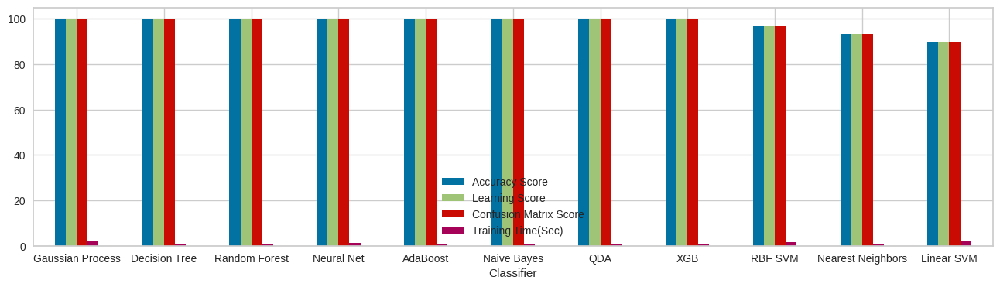

In [ ]:
classifierTable(classifierList)

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


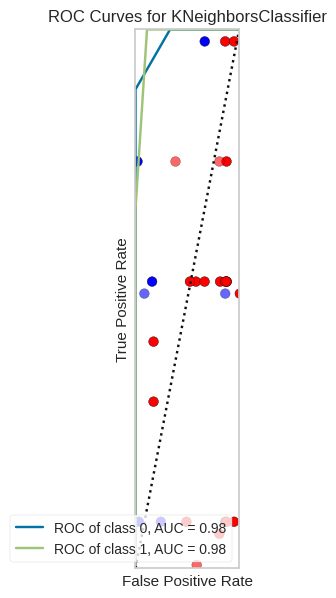

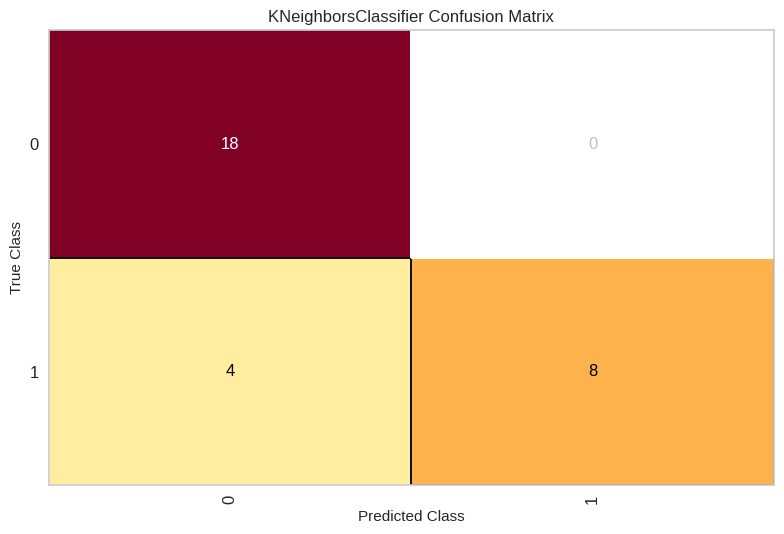

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


An exception occurred
Data must be 1-dimensional
Classifier = Nearest Neighbors, Score (test, accuracy) = 86.67, Training time = 0.33 seconds


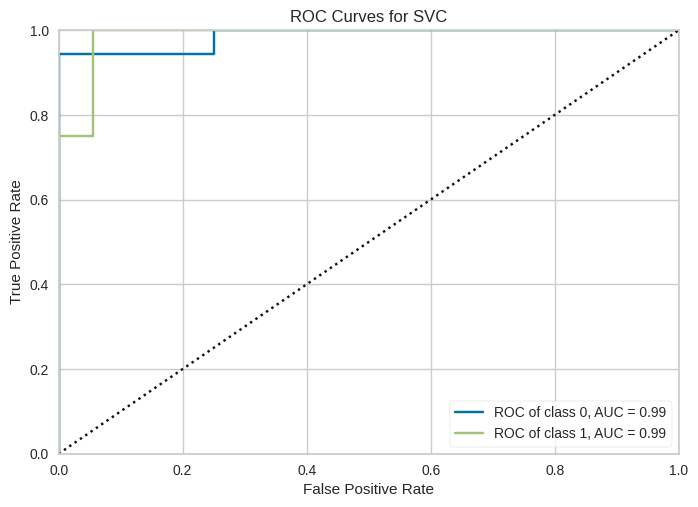

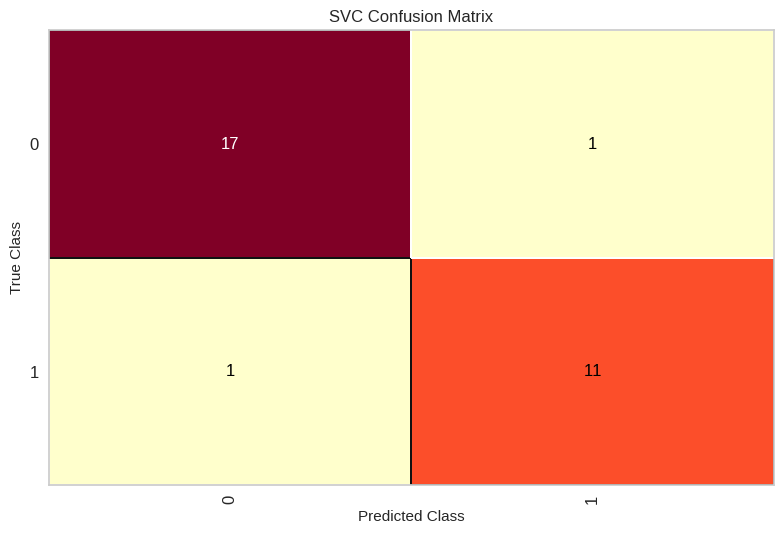

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


An exception occurred
predict_proba is not available when probability=False
Classifier = Linear SVM, Score (test, accuracy) = 93.33, Training time = 0.50 seconds


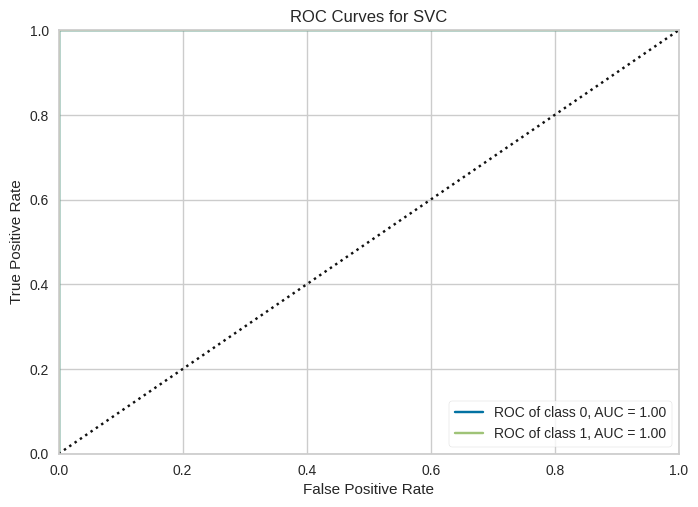

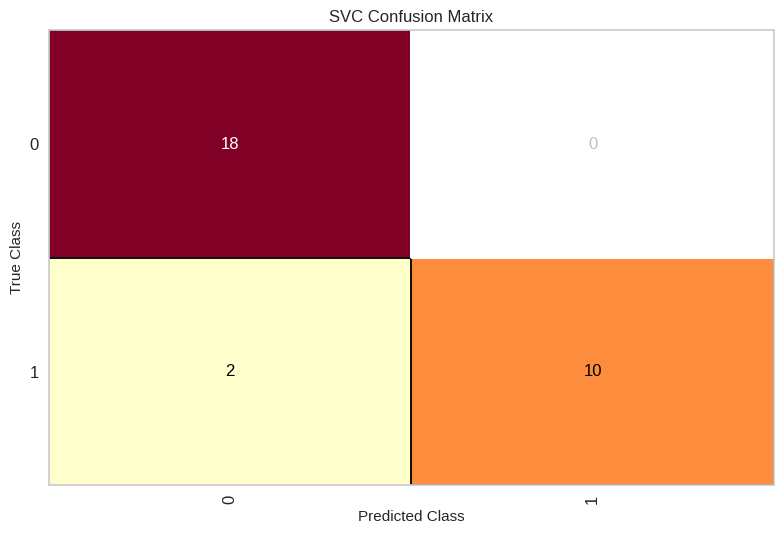

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


An exception occurred
predict_proba is not available when probability=False
Classifier = RBF SVM, Score (test, accuracy) = 93.33, Training time = 0.52 seconds


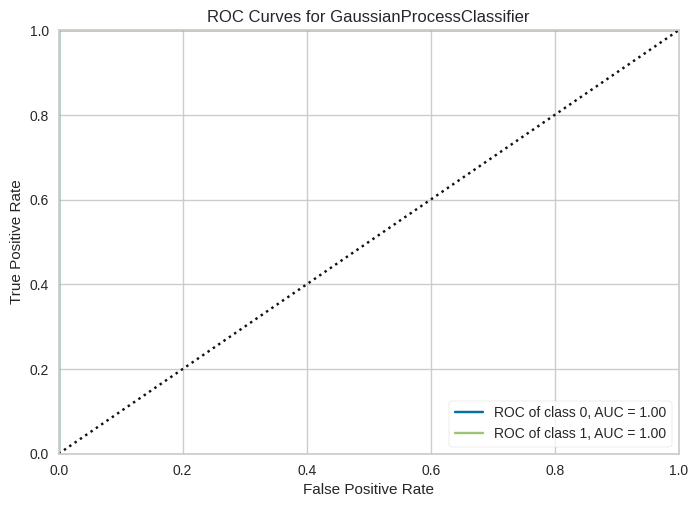

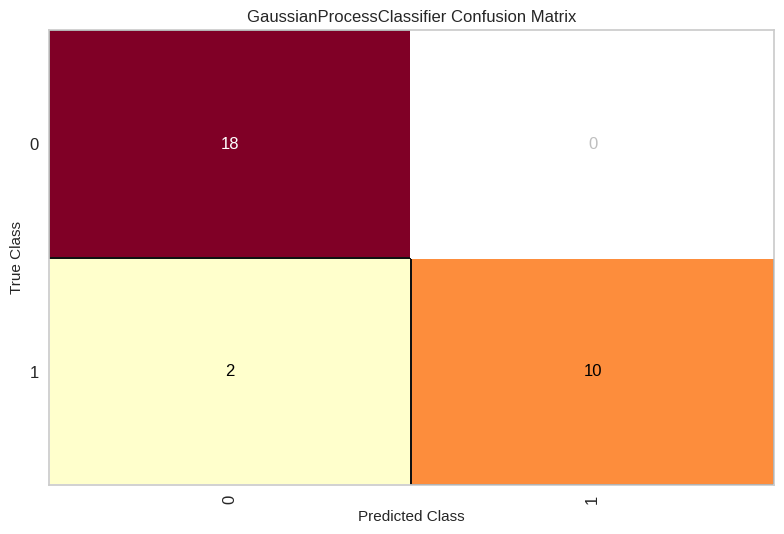

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


An exception occurred
Data must be 1-dimensional
Classifier = Gaussian Process, Score (test, accuracy) = 93.33, Training time = 1.38 seconds


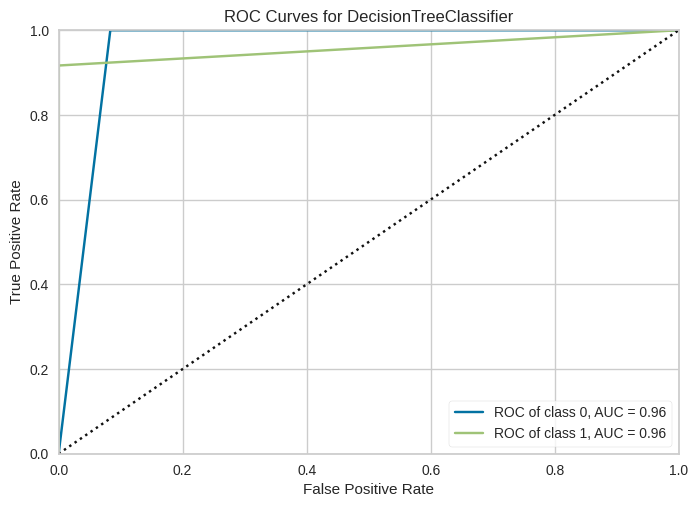

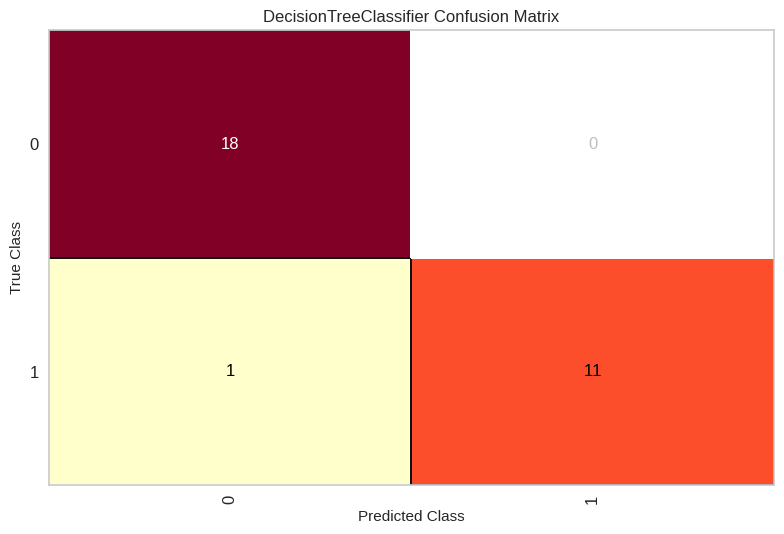

An exception occurred
Data must be 1-dimensional
Classifier = Decision Tree, Score (test, accuracy) = 96.67, Training time = 0.80 seconds


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


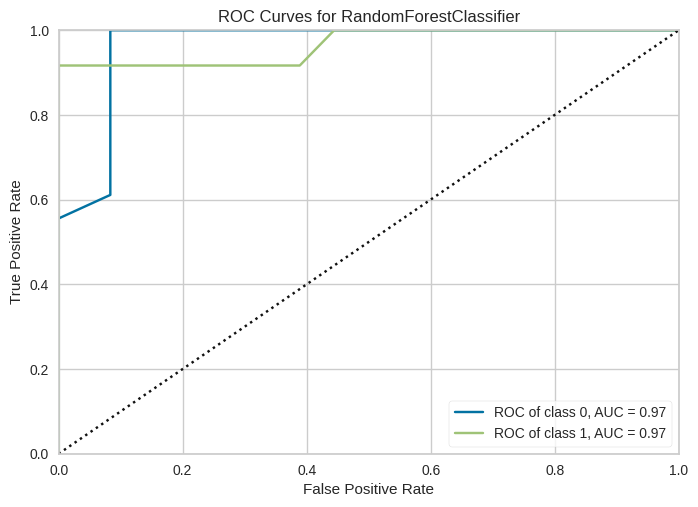

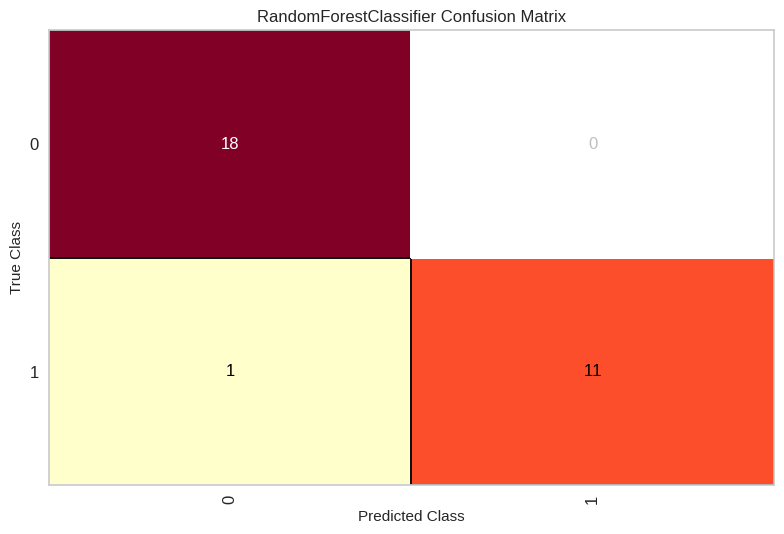

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


An exception occurred
Data must be 1-dimensional
Classifier = Random Forest, Score (test, accuracy) = 96.67, Training time = 1.02 seconds


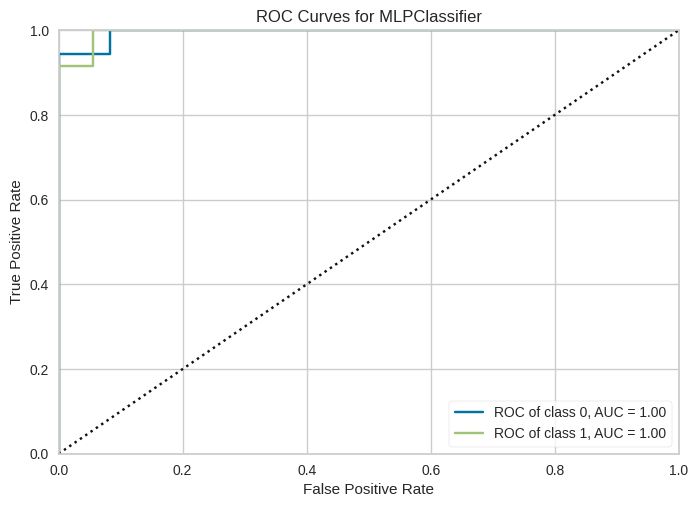

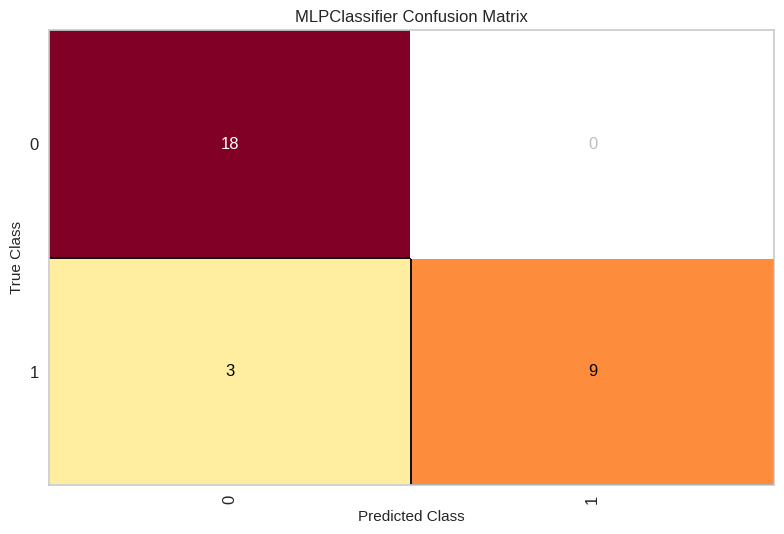

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


An exception occurred
Data must be 1-dimensional
Classifier = Neural Net, Score (test, accuracy) = 90.00, Training time = 3.00 seconds


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


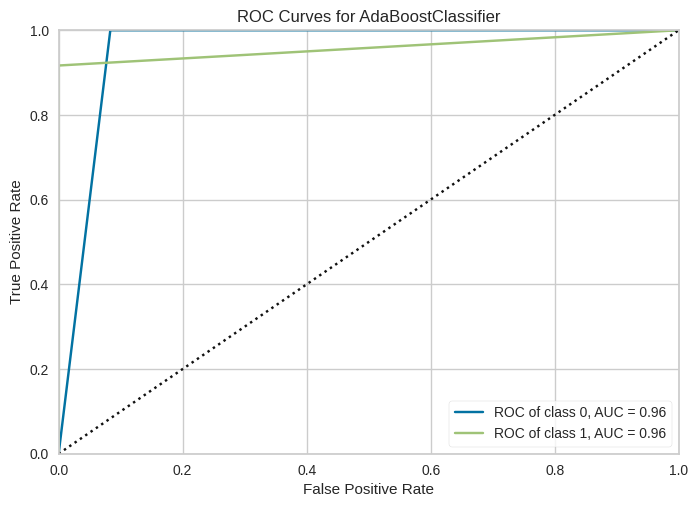

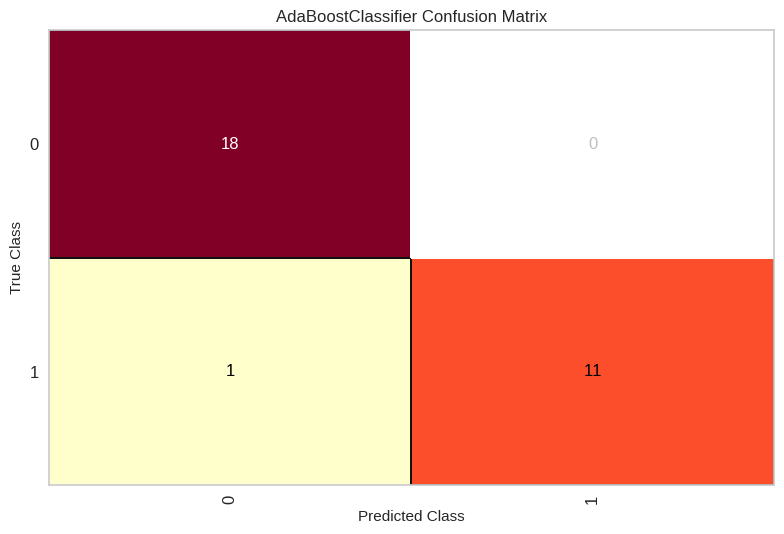

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


An exception occurred
Data must be 1-dimensional
Classifier = AdaBoost, Score (test, accuracy) = 96.67, Training time = 0.83 seconds


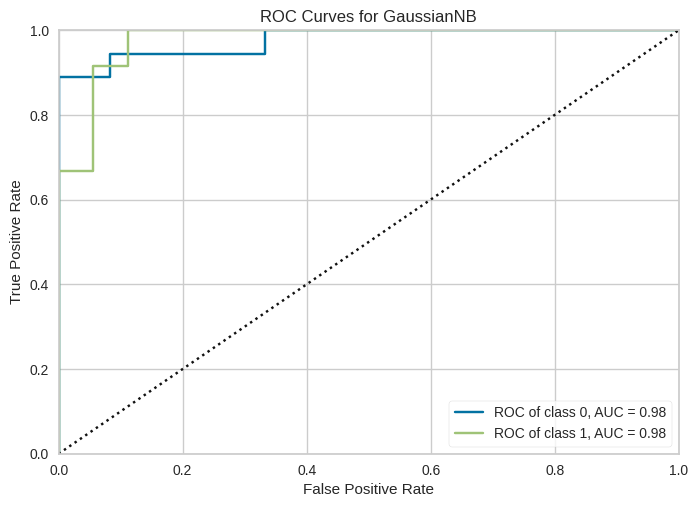

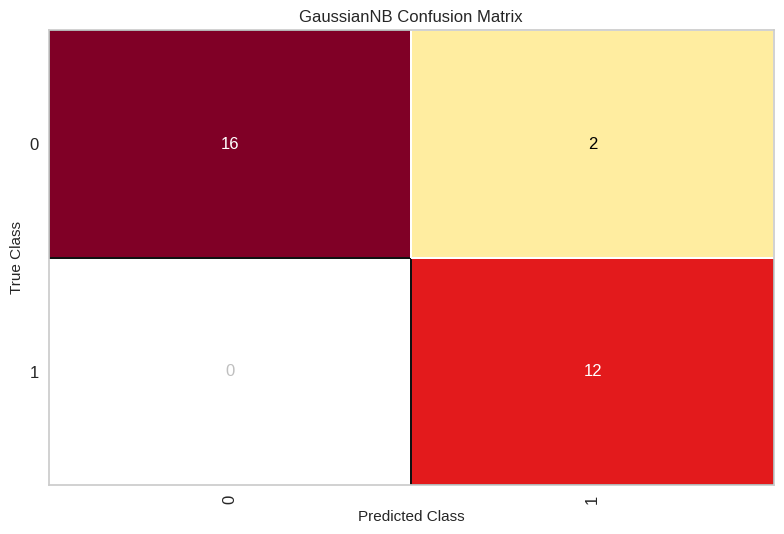

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:935: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


An exception occurred
Data must be 1-dimensional
Classifier = Naive Bayes, Score (test, accuracy) = 93.33, Training time = 1.20 seconds


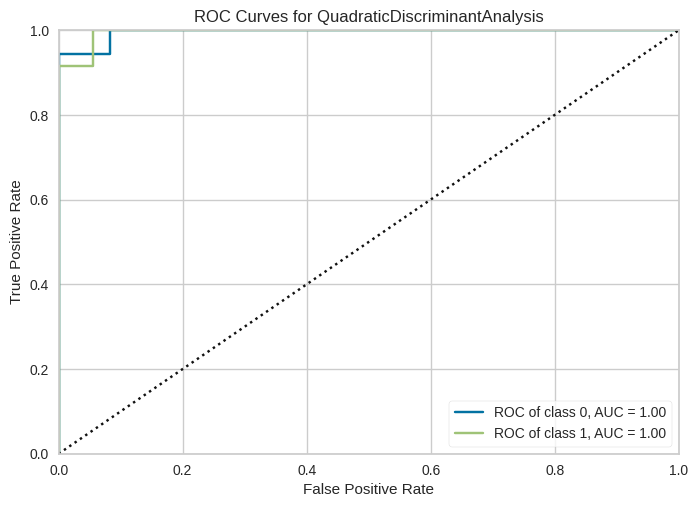

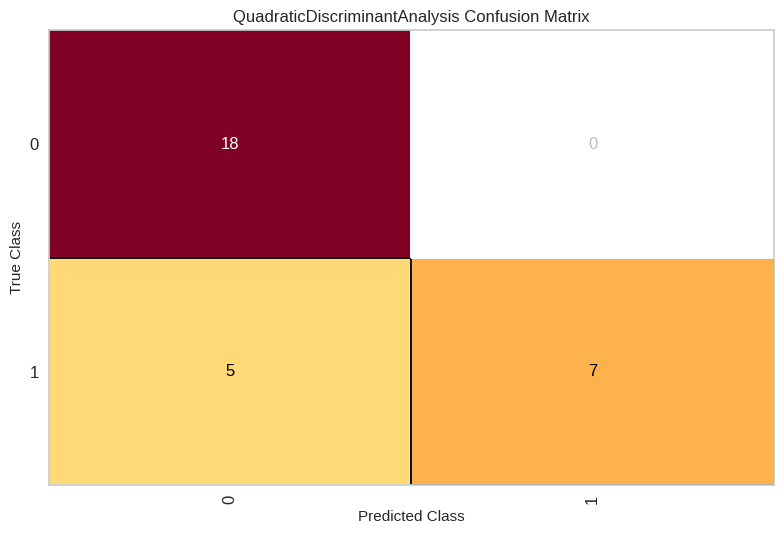

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:935: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


An exception occurred
Data must be 1-dimensional
Classifier = QDA, Score (test, accuracy) = 83.33, Training time = 1.73 seconds


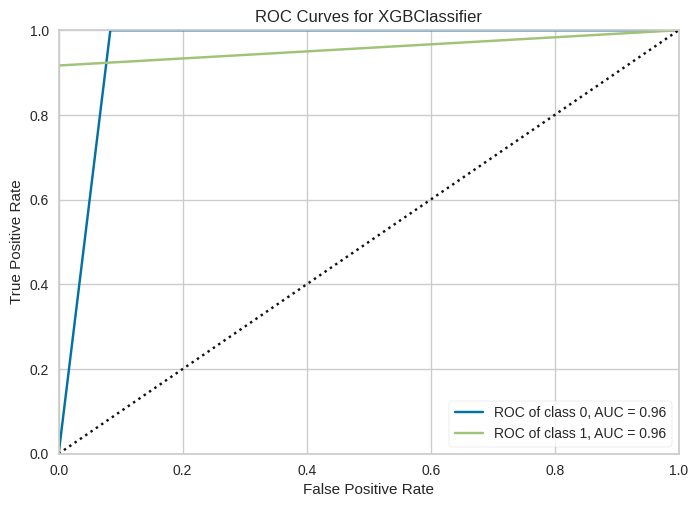

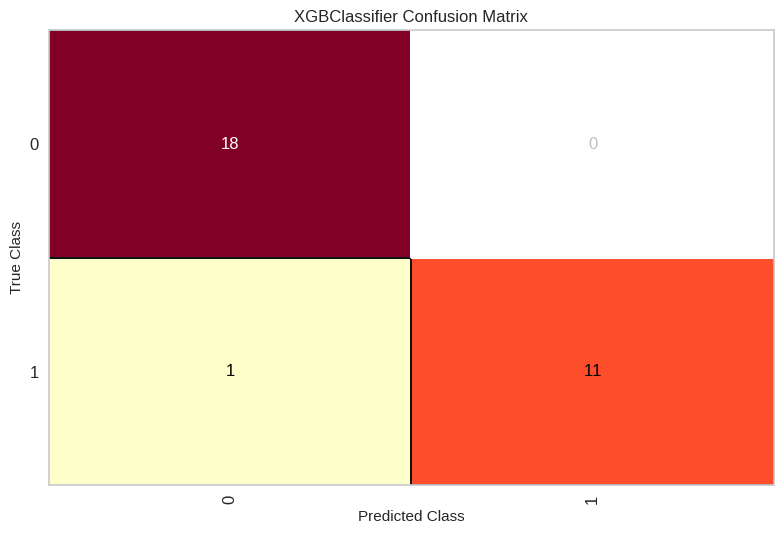

An exception occurred
Data must be 1-dimensional
Classifier = XGB, Score (test, accuracy) = 96.67, Training time = 2.66 seconds
--------------------------------------------------------------------------------
Best --> Classifier = Decision Tree, Score (test, accuracy) = 96.67


In [ ]:
df_ml1 = df_train[['ListPrice','Rent','owner_profit','profit_score','owner_payable']].copy()
X_data_reshape= df_ml1.drop('profit_score', axis=1)
y_data = df_ml1.iloc[:, [3]]
featureTransformation(X_data_reshape,y_data)

Classifier Comparison Table
Classifiers:


,Classifier,Accuracy Score,Learning Score,Confusion Matrix Score,Training Time(Sec)
4,Decision Tree,96.666667,96.666667,96.666667,0.804089
5,Random Forest,96.666667,96.666667,96.666667,1.016255
7,AdaBoost,96.666667,96.666667,96.666667,0.834231
10,XGB,96.666667,96.666667,96.666667,2.664529
1,Linear SVM,93.333333,93.333333,93.333333,0.495995
2,RBF SVM,93.333333,93.333333,93.333333,0.518280
3,Gaussian Process,93.333333,93.333333,93.333333,1.377542
8,Naive Bayes,93.333333,93.333333,93.333333,1.200732
6,Neural Net,90.000000,90.000000,90.000000,2.997280
0,Nearest Neighbors,86.666667,86.666667,86.666667,0.329632


-----------------------------------------------


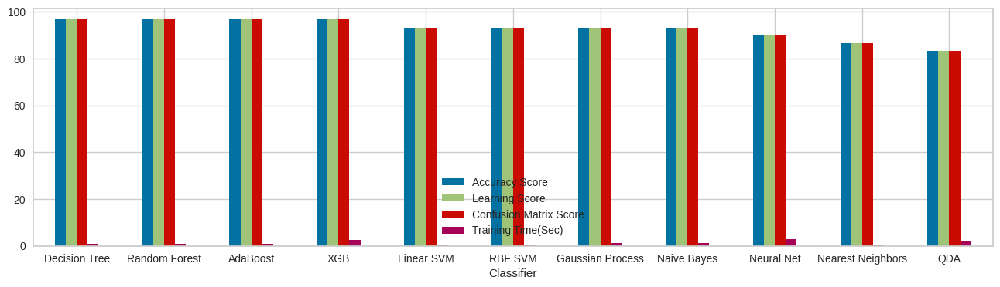

In [ ]:
classifierTable(classifierList)

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


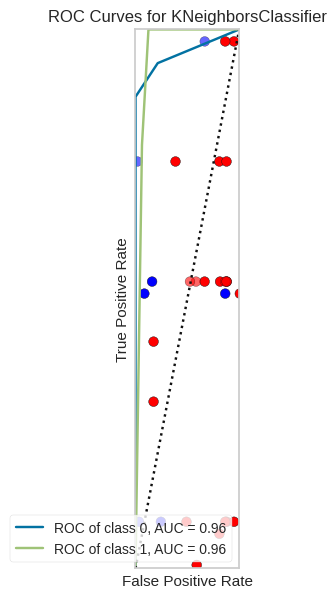

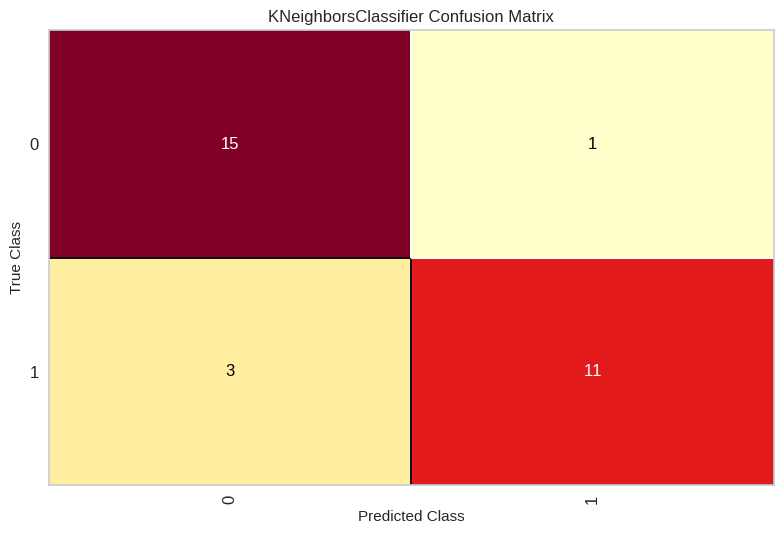

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


An exception occurred
Data must be 1-dimensional
Classifier = Nearest Neighbors, Score (test, accuracy) = 86.67, Training time = 0.34 seconds


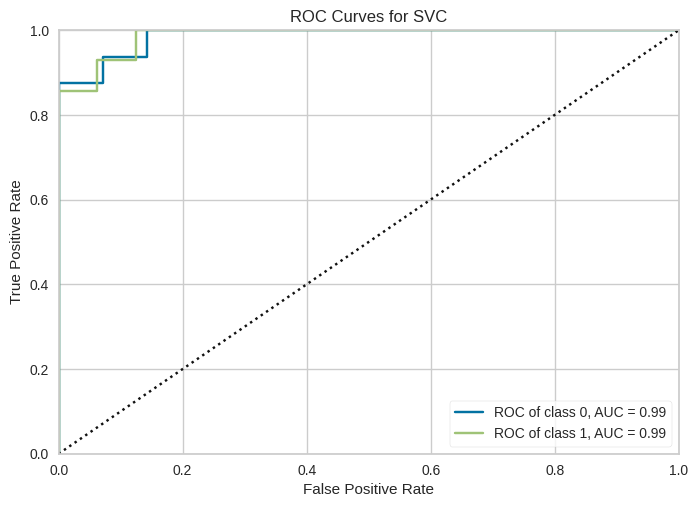

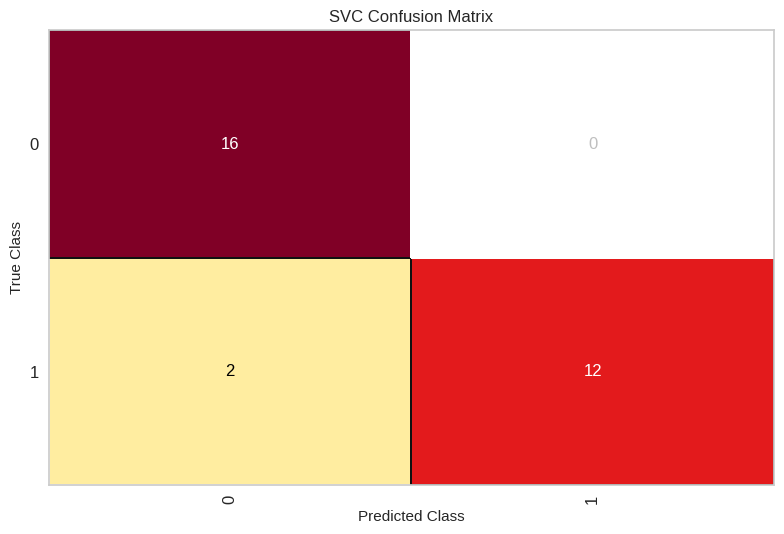

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


An exception occurred
predict_proba is not available when probability=False
Classifier = Linear SVM, Score (test, accuracy) = 93.33, Training time = 0.51 seconds


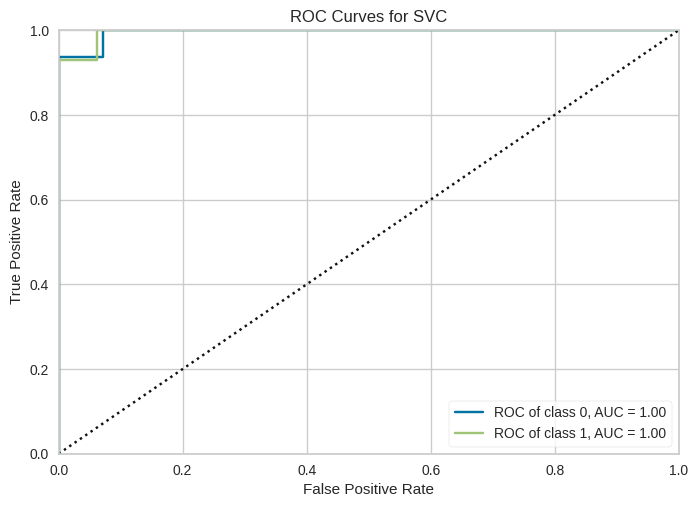

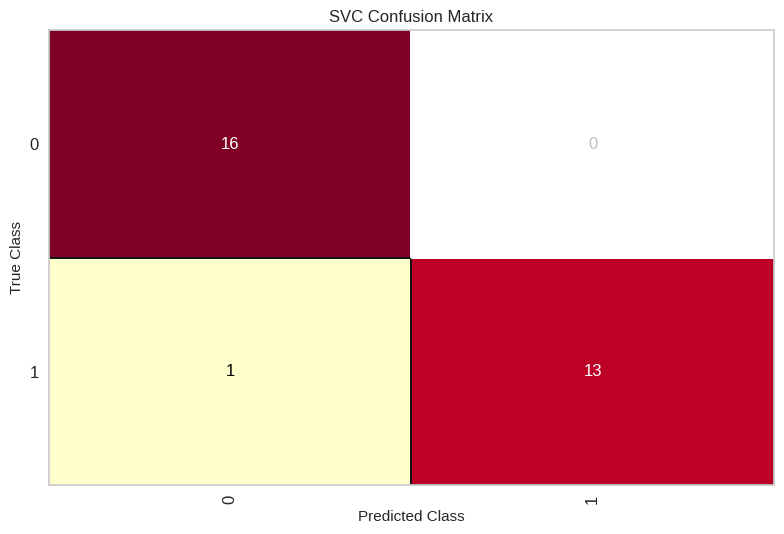

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


An exception occurred
predict_proba is not available when probability=False
Classifier = RBF SVM, Score (test, accuracy) = 96.67, Training time = 0.49 seconds


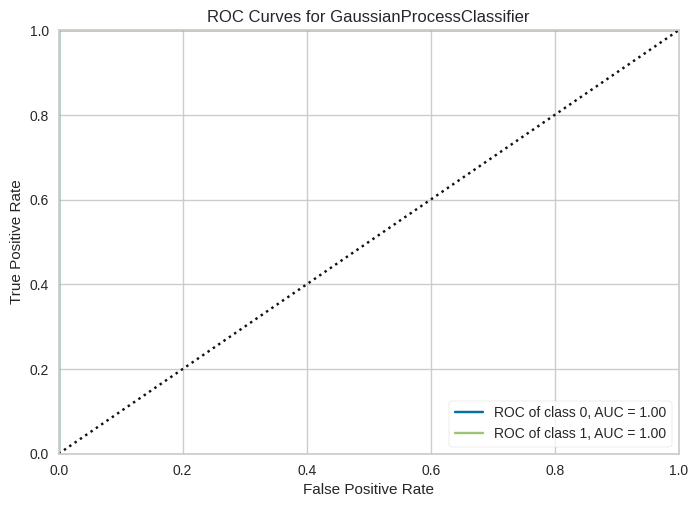

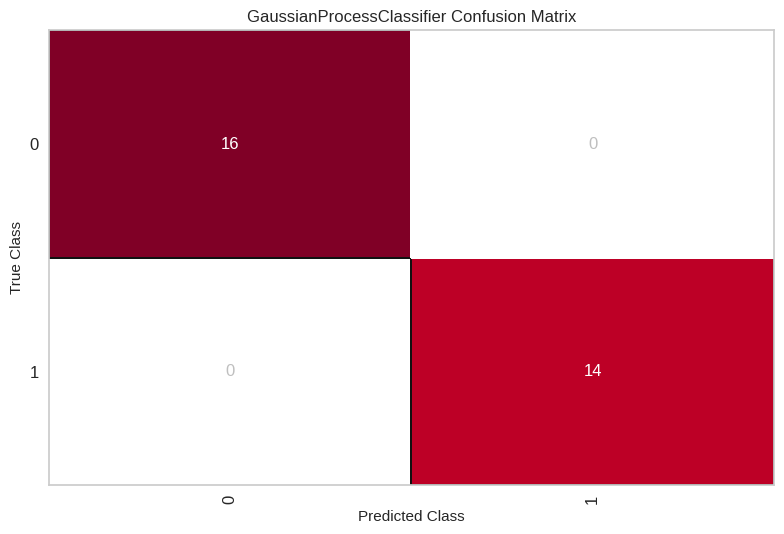

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


An exception occurred
Data must be 1-dimensional
Classifier = Gaussian Process, Score (test, accuracy) = 100.00, Training time = 1.18 seconds


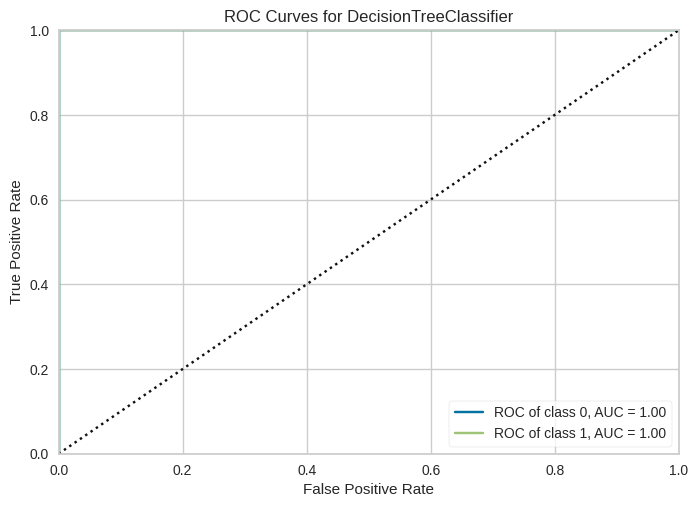

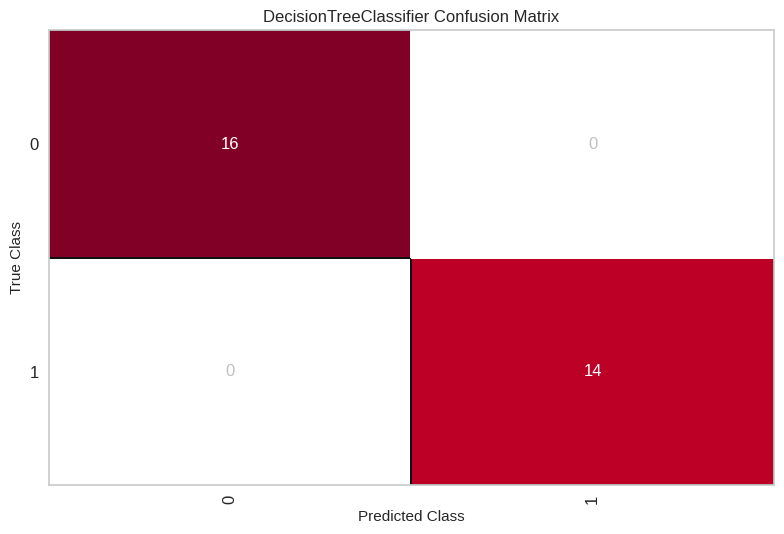

An exception occurred
Data must be 1-dimensional
Classifier = Decision Tree, Score (test, accuracy) = 100.00, Training time = 0.56 seconds


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


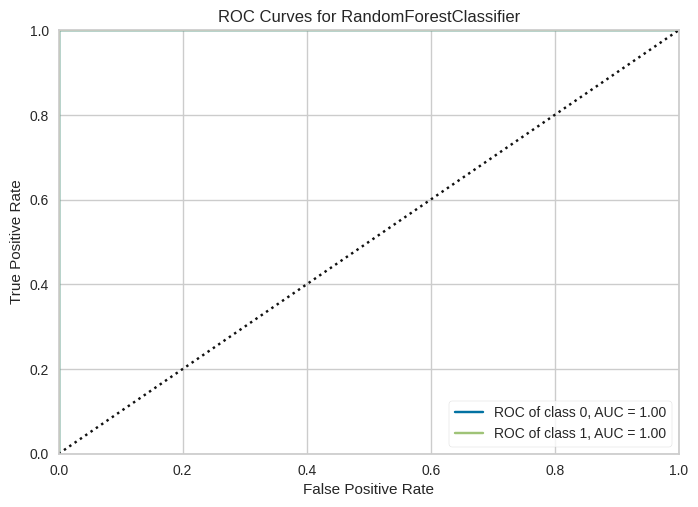

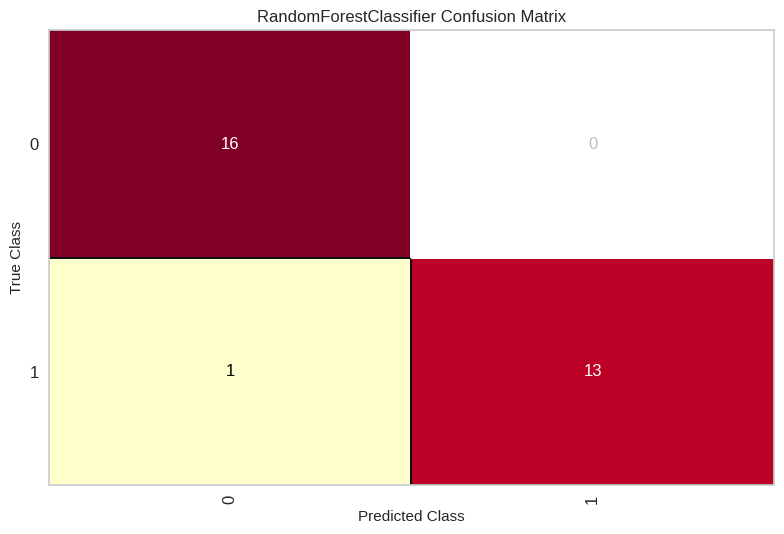

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


An exception occurred
Data must be 1-dimensional
Classifier = Random Forest, Score (test, accuracy) = 96.67, Training time = 0.54 seconds


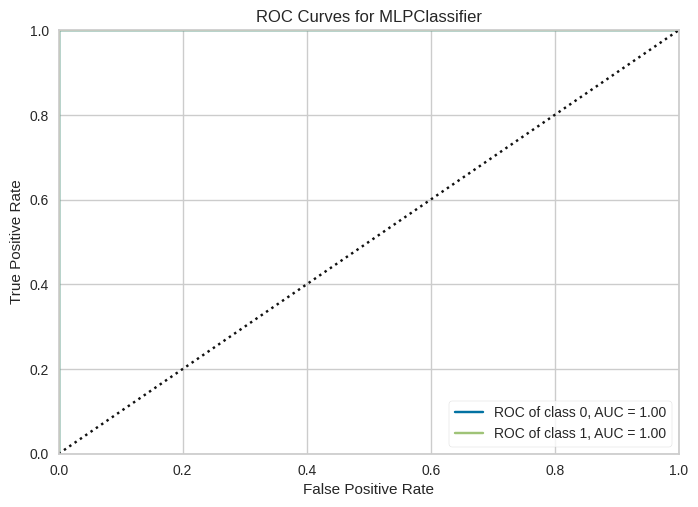

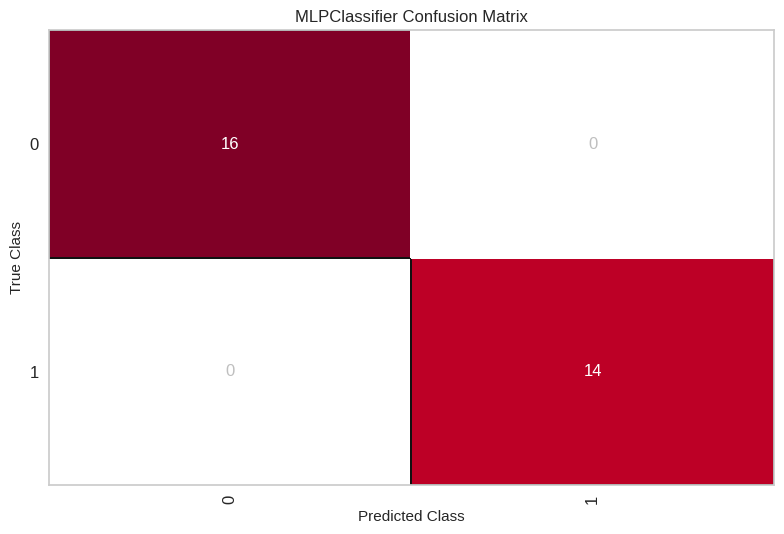

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


An exception occurred
Data must be 1-dimensional
Classifier = Neural Net, Score (test, accuracy) = 100.00, Training time = 1.22 seconds


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


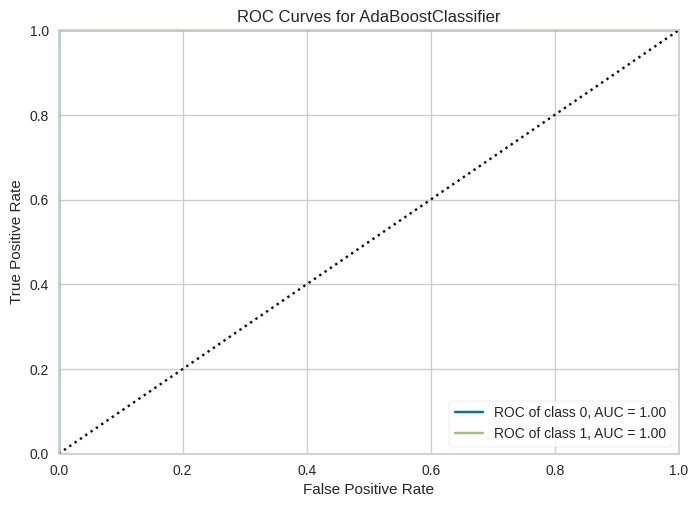

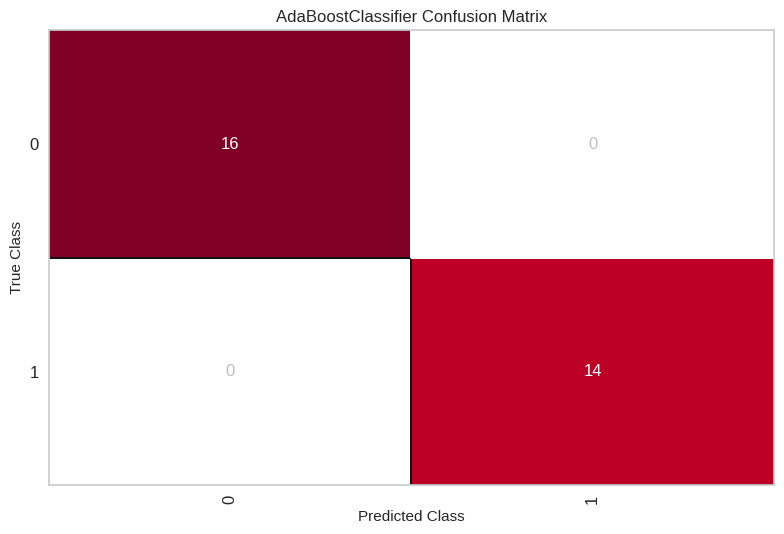

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


An exception occurred
Data must be 1-dimensional
Classifier = AdaBoost, Score (test, accuracy) = 100.00, Training time = 0.55 seconds


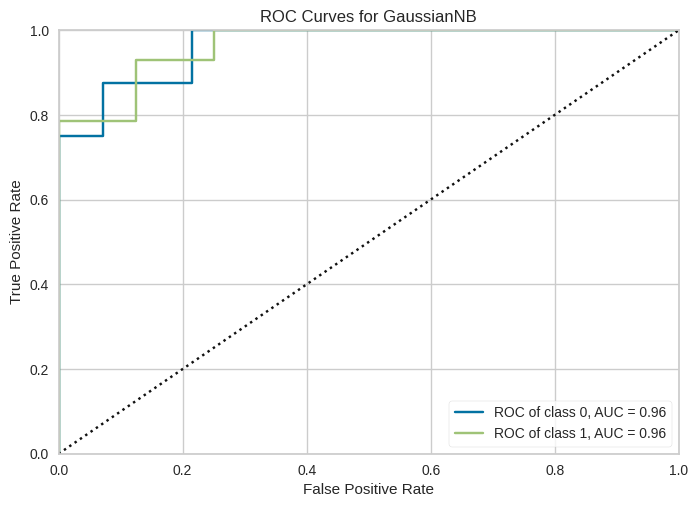

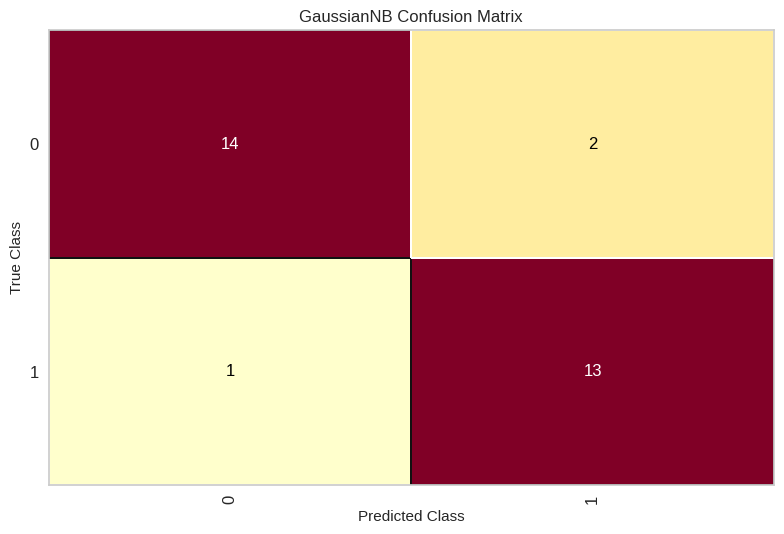

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:935: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


An exception occurred
Data must be 1-dimensional
Classifier = Naive Bayes, Score (test, accuracy) = 90.00, Training time = 0.49 seconds


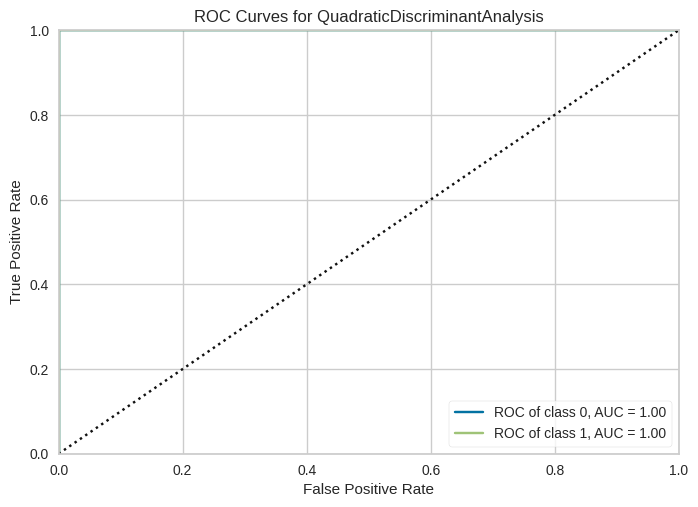

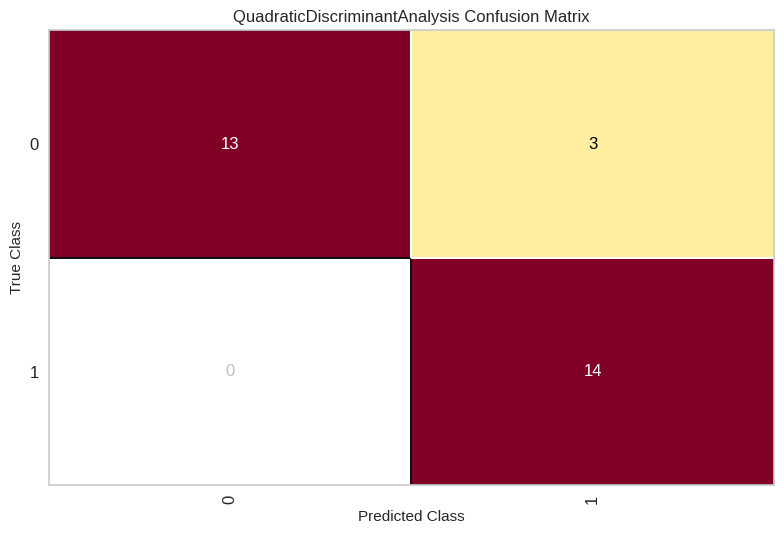

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:935: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


An exception occurred
Data must be 1-dimensional
Classifier = QDA, Score (test, accuracy) = 90.00, Training time = 0.74 seconds


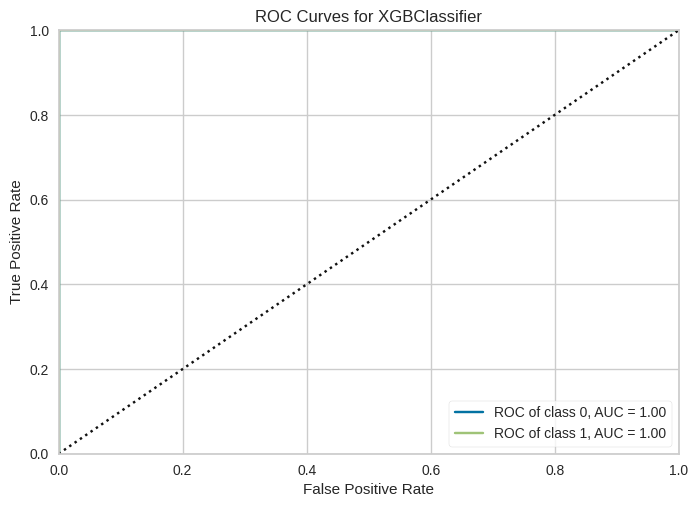

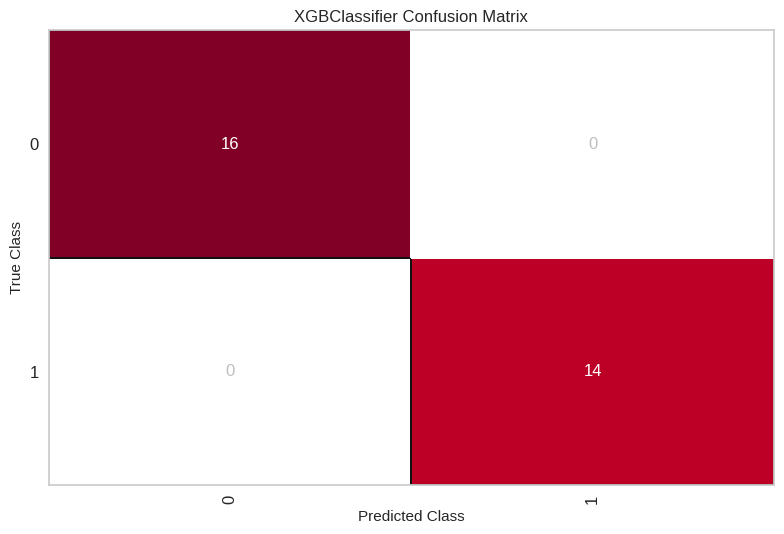

An exception occurred
Data must be 1-dimensional
Classifier = XGB, Score (test, accuracy) = 100.00, Training time = 1.18 seconds
--------------------------------------------------------------------------------
Best --> Classifier = Gaussian Process, Score (test, accuracy) = 100.00


In [ ]:
df_ml3 = df_train[['ListPrice','Rent','owner_payable','owner_profit','profit_score','EstSF']].copy()
X_data_reshape= df_ml3.drop('profit_score', axis=1)
y_data = df_ml3.iloc[:, [4]]
featureTransformation(X_data_reshape,y_data)

Classifier Comparison Table
Classifiers:


,Classifier,Accuracy Score,Learning Score,Confusion Matrix Score,Training Time(Sec)
3,Gaussian Process,100.000000,100.000000,100.000000,1.180588
4,Decision Tree,100.000000,100.000000,100.000000,0.560032
6,Neural Net,100.000000,100.000000,100.000000,1.216865
7,AdaBoost,100.000000,100.000000,100.000000,0.546045
10,XGB,100.000000,100.000000,100.000000,1.176748
2,RBF SVM,96.666667,96.666667,96.666667,0.488211
5,Random Forest,96.666667,96.666667,96.666667,0.544585
1,Linear SVM,93.333333,93.333333,93.333333,0.505522
8,Naive Bayes,90.000000,90.000000,90.000000,0.489234
9,QDA,90.000000,90.000000,90.000000,0.737239


-----------------------------------------------


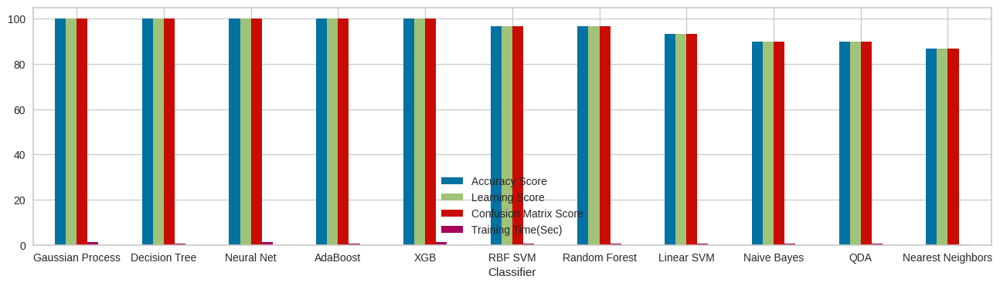

In [ ]:
classifierTable(classifierList)

**Based on the above classifier scores, we will try ADABoost and Decision Tree for prediction**

# Result 1: Predicting with ADABoost classifier.

In [ ]:
clf = AdaBoostClassifier(n_estimators=10, algorithm='SAMME').fit(X, y)
X, y = X_data_reshape, y_data

X = StandardScaler().fit_transform(X)
X_train, X_test, y_train, y_test = \
        train_test_split(X, y, test_size=.2)
clf.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


AdaBoostClassifier(algorithm='SAMME', n_estimators=10)

In [ ]:
import pickle
pickle.dump(clf, open("SanDiego_Housing_Trend_Model1_Jignesh_Madhani", 'wb'))

In [ ]:
print('\nResult : 0 - House with Loss')
print('Result : 1 - House with Profit')

print('\n\nExample 1 : ListPrice: 310000, Rent : 1950, Owner Payments : 2187 Per Month Profit : -237.0')
print("Predicted Selling Price : ",clf.predict(np.array([[310000,1950,2187,-237,1007]])))

print('\n\nExample 2 : ListPrice: 399900, Rent : 2550, Owner Payments : 2382 Per Month Profit : 168.0')
print("Predicted Selling Price : ",clf.predict(np.array([[399900,2550,2382,168,1611]])))

print('\n\nExample 3 : ListPrice: 374000, Rent : 2200, Owner Payments : 1974 Per Month Profit : 226.0')
print("Predicted Selling Price : ",clf.predict(np.array([[374000,2200,1974,226,1061]])))

print('\n\nExample 4 : ListPrice: 379000, Rent : 2200, Owner Payments : 2299 Per Month Profit : -99.0')
print("Predicted Selling Price : ",clf.predict(np.array([[379000,2200,2299,-99,1061]])))


Result : 0 - House with Loss
Result : 1 - House with Profit


Example 1 : ListPrice: 310000, Rent : 1950, Owner Payments : 2187 Per Month Profit : -237.0
Predicted Selling Price :  [0]


Example 2 : ListPrice: 399900, Rent : 2550, Owner Payments : 2382 Per Month Profit : 168.0
Predicted Selling Price :  [1]


Example 3 : ListPrice: 374000, Rent : 2200, Owner Payments : 1974 Per Month Profit : 226.0
Predicted Selling Price :  [1]


Example 4 : ListPrice: 379000, Rent : 2200, Owner Payments : 2299 Per Month Profit : -99.0
Predicted Selling Price :  [0]


**As seen in the above result, the model was able to correctly predict if the house is a profitable or not.**

# Result 1: Predicting with Decision Tree classifier.

In [ ]:
df_rf = df_train.filter(items=['ListPrice','Rent','owner_payable','owner_profit','profit_score','SellingPrice'])

from sklearn.tree import DecisionTreeClassifier
from sklearn import preprocessing
clf = DecisionTreeClassifier()
clf
X= df_rf.drop('SellingPrice', axis=1)
y = df_rf.iloc[:, [5]]
clf.fit(X,y)

DecisionTreeClassifier()

In [ ]:
pred = clf.predict(X)
metrics.accuracy_score(y, pred)

1.0

In [ ]:
import pickle
pickle.dump(clf, open("SanDiego_Housing_Trend_Model2_Jignesh_Madhani", 'wb'))

In [ ]:
print('\nResult : 0 - House with Loss')
print('Result : 1 - House with Profit')

print('\n\nExample 1 : ListPrice: 310000, Rent : 1950, Owner Payments : 2187 Per Month Profit : -237.0')
print("Predicted Selling Price : ",clf.predict(np.array([[310000,1950,2187,-237,0]])))

print('\n\nExample 2 : ListPrice: 399900, Rent : 2550, Owner Payments : 2382 Per Month Profit : 168.0')
print("Predicted Selling Price : ",clf.predict(np.array([[399900,2550,2382,168,1]])))

print('\n\nExample 3 : ListPrice: 374000, Rent : 2200, Owner Payments : 1974 Per Month Profit : 226.0')
print("Predicted Selling Price : ",clf.predict(np.array([[374000,2200,1974,226,1]])))

print('\n\nExample 4 : ListPrice: 379000, Rent : 2200, Owner Payments : 2299 Per Month Profit : -99.0')
print("Predicted Selling Price : ",clf.predict(np.array([[379000,2200,2299,-99,0]])))


Result : 0 - House with Loss
Result : 1 - House with Profit


Example 1 : ListPrice: 310000, Rent : 1950, Owner Payments : 2187 Per Month Profit : -237.0
Predicted Selling Price :  [290000.]


Example 2 : ListPrice: 399900, Rent : 2550, Owner Payments : 2382 Per Month Profit : 168.0
Predicted Selling Price :  [405000.]


Example 3 : ListPrice: 374000, Rent : 2200, Owner Payments : 1974 Per Month Profit : 226.0
Predicted Selling Price :  [400000.]


Example 4 : ListPrice: 379000, Rent : 2200, Owner Payments : 2299 Per Month Profit : -99.0
Predicted Selling Price :  [368000.]


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


**As seen in the above result, the model was able to accurately predict the house selling prices.**